# Airline Flight Delay 
### Team 20
##### Sanjay Saravanan, Sean Campos, Devesh Khandelwal, and Karthik Rameshbabu
##### 12/11/2020
##### Course: Machine Learning at Scale (w261)

## Introduction

Predicting Flight Delay has been an age old problem troubling travellers, airport administrators, and airline staff alike. After studying various pieces of literature in this space, our team has taken a stab at using **flight**, **weather**, and **airport** data to build machine learning models that will **predict whether a flight will be delayed, or not delayed,** based off a variety of features. We hope this report will shed light on our journey and our discoveries.

#### Context:
As we are all painfully aware, airline delays are all too common of an experience.  And as airports are one of the most resource intensive shared spaces in modern commerce, delays bring increased costs to crews, airport personnel, limited gate availability, fuel and maintenance cost as well as to the passengers.  The FAA reports that in 2019 flight delays cost the airlines more than $8 billion, passengers more than $18 billion, an additional $6 billion in lost demand and indirect costs.  Every minute of recovered delay time is worth at least $75.  While many of the event sequences that cause these delays are too complicated to fully prevent, predicting them and providing advanced notice to the multitude of interested parties would not only be a convenience, but a significant savings in wasted resources. Passengers would not have to spend as much time occupying expensive shared resources and airport personnel could take the necessary steps to allocate limited resources such as gates and scheduled equipment usage to not only save resources, but also mitigate the propagation of the delay downstream to additional flights, crews and passengers.

Our specific objective is to predict whether or not each flight will depart from the gate more than fifteen minutes after the scheduled departure time based on all of the information available two hours prior to departure.  These predictions are suitable for triggering both a customer centric notification system, such as push notifications through an air carrier’s app, as well as the airport’s internal resource coordination infrastructure. 

While every prediction algorithm strives for accuracy, we think it’s important to note that there may be a high cost to **false positives** associated with this system.  Passengers mistakenly believing that they have more time to arrive at the airport or misallocating airport resources for an incoming flight could be far more costly than the benefits of having a prediction system in the first place.  For this reason, **precision** will be our **most important metric** as it will force us to focus on reducing false positives.

In the previous publications that take a big data approach with similar datasets, we have found that Choi et. al. [1] achieved accuracy=0.80 with precision=0.71 and Patgiri et. al. [2] achieved accuracy=0.82 with precision=0.82.  In both papers, many machine learning algorithms were explored ranging from KNN to logistic regression and various tree based methods, yet the best performance was achieved with random forests.


> 1. S. Choi, Y. Kim, S. Briceno, and D. Mavris. Prediction of weather-induced airline delays based on machine learning algorithms.  In AIAA/IEEE Digital Avionics Systems Confer-ence - Proceedings, volume 2016-December, 2016. [https://ieeexplore.ieee.org/document/7777956]
> 2. R. Patgiri, S. Hussain, and A. Nongmeikapam. Empirical Study on Airline Delay Analysis and Prediction. In EAI Endorsed Transactions 2020. [https://arxiv.org/pdf/2002.10254.pdf]

%md

### Raw Data

Here we pull in the following **raw** data tables and take a snapshot of the data size.

**Stations - 726.46 KB (.csv.gz)**

**Airlines - 1.52 GB (zip)**

| Year   | Size |
|-------|----------|
| 2015: | 276.03 MB  |
| 2016: | 277.71 MB  |
| 2017: | 284.77 MB  |
| 2018: | 351.83 MB  |
| 2019: | 364.75 MB  |


**Weather - 23.64 GB (parquet)**

| Year   | Size |
|-------|----------|
| 2015: | 4.49 GB  |
| 2016: | 4.69 GB  |
| 2017: | 4.72 GB  |
| 2018: | 4.73 GB  |
| 2019: | 4.87 GB  |
| MISS: | 144.74 MB  |

### Imports

Included are all the imports we require for the project. Organized into the appropriate sections

In [0]:
#PySpark SQL
from pyspark.sql import SQLContext
from pyspark.sql import functions as f
from pyspark.sql import Window
import pyspark.sql.types as t # We can just do this and avoid large lsit of import types
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, IntegerType, NullType, ShortType, DateType, BooleanType, BinaryType
from pyspark.sql.functions import concat, col, hour, minute, lpad, rpad, substring, year, month, dayofmonth, lit, to_timestamp, expr,split
from pyspark.sql.functions import isnan, when, count, col, to_timestamp, udf

#Utiliities
import pandas as pd
import numpy as np
import math
import us
# from haversine import haversine, Unit

#Date/Time
from datetime import datetime as dt, timedelta
from timezonefinder import TimezoneFinder
from pytz import timezone
import time
import pytz


#Plotting
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sn
import matplotlib.cm as cm, matplotlib.font_manager as fm

#Modelling
from sklearn.metrics import roc_curve, auc, accuracy_score, f1_score, classification_report, confusion_matrix
from pyspark.ml.feature import StringIndexer, VectorIndexer, VectorAssembler, StandardScaler, OneHotEncoder, SQLTransformer
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml import Pipeline
import mlflow
import mlflow.spark



sqlContext = SQLContext(sc)

## EDA - Exploratory Data Analysis

In this section, we would like to showcase some of the key findings / descriptive statistics from our datasets. We have decided to include some markdown cells to highlight certain code chunks used in the EDA process. To ensure notebook clarity, we have chosen to only include the highlights of our EDA and links are included to separate notebooks that go into more detail for various data cleaning steps as well as additional exploration.

### Stations Data

##### us_stations_all
In a search to find a way to join stations data with airlines and weather, our team looked to enrich the station tables with corresponding **IATA** airports codes. This would provide a deterministic foreign key across tables. 

This is when we came across this data source https://www.aviationweather.gov/docs/metar/stations.txt. Our took it as a task to scrape this data and parse it into a workable format, the work for this is linked in this [notebook].

From this we built a tabled called `us_stations_all` that we made available to all project teams via Databricks public tables

[notebook]: https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275119900/command/4061768275119902

In [0]:
#us_stations_all sample
us_stations_all = spark.sql("select * from us_stations_all limit 5")
display(us_stations_all)

CD,STATION,ICAO,IATA,SYNOP,LAT,LONG,ELEV,M,N,V,U,A,C,PRIOR,COUNTRY
AK,ADAK NAS,PADK,ADK,70454,51 53N,176 39W,3,X,null,T,null,null,null,7,US
AK,AKHIOK,PAKH,AKK,null,56 56N,154 11W,15,X,null,null,null,null,null,8,US
AK,AKUTAN,PAUT,null,null,54 08N,165 36W,25,X,null,null,null,null,null,7,US
AK,ALASKAN ARTCC,PZ74,Z74,null,60 09N,164 17W,1,null,null,A,null,null,null,8,US
AK,ALASKAN ARTCC,PZ76,Z76,null,65 15N,134 39W 6,47,null,null,A,null,null,null,8,US


The inital `us_stations_all` was a great start, however we intially ran into trouble when joining it with the airport table lead to dropped rows.  We used anti-joins to interrogate the missing rows and found that there were some missing and duplicate station values.

The second cleaning phase occured when joining the stations list with the weather table. Due to minor errors in the table, as well as some out of date information involving stations that had been replaced, certain overlaping time periods of data were causing joins to multiply the number of weathe observation rows. After more careful cleaning of the station data we were able to associate nearly 24 observations per day with most stations and quantify the amount of missing weather values that would need to be strategically filled in or accounted for.

In th graph below, we can see the number of weather measurements per day per station, which shows that a siginficant number of stations have complete data, but the long tail to the left represents the amount of missing values which will need a strategy for handling.

<img src="https://github.com/seancampos/w261-fp-images/raw/master/weather_obs_per_day_per_station.jpg" width="600">

Additonal details in the EDA [notebook].

[notebook]: https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/231034620066236/command/231034620066254

### Airlines Data

In [0]:
#Every row represents one flight. ORIGIN -> DEST
raw_airlines = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/201*.parquet")
print("Number of flights (2015 - 2019):  ", raw_airlines.count())
print("Number of data columns:  ", len(raw_airlines.columns))

Number of flights (2015 - 2019): 31746841
Number of data columns: 109

#### Drop Some Data
We'd like to highlight the count of `NULL` values by column of the airlines data from the get go. The total number of rows in our raw data is `31,746,841`, some columns have nearly `25,000,000+` rows that are `NULL` values. In a scenario where 80% of a column is `NULL`, we have very minimal raw data to use to derive any reasonable imputation method. After learning more about some of these columns from the [documentation], our team came to the conclusion that to minimize noise, dropping these columns was appropriate, and focussing on discovering other signals was the right choice.

Dropping irrelevant columns helped trim the horizontal cardinality of our data, but we still had many rows that held `NULL` values. Our approach then was to look at the counts, distributions, and visualize various columns in our data. After learning the general trends of columns in our dataset, we wanted to know if dropping all rows that had even a single `NULL` value would negatively impact the trends we say, for example if there was some bias with rows that had `NULL` values. 

We concluded that this was **not** the case, and that by dropping all remaining rows with `NULL` values we did not interfere with existing trends of the data. Therefore we dropped **575,642 rows** which is **1.8132%** of our raw airlines data. This was a tradeoff we were willing to make, losing a very minimal amount of data in exchange for reducing noise and making data processing much easier.



This and further EDA linked [here] describes the decisions to drop this data.



[here]: https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/231034620064198/command/231034620067191
[documentation]: https://www.transtats.bts.gov/DL_SelectFields.asp?Table_ID=236&DB_Short_Name=On-Time

In [0]:
#COL_NAME | Number of NULLs
raw_null_counts_pd = raw_airlines.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in raw_airlines.columns]).toPandas()
raw_null_counts_pd = raw_null_counts_pd.T.rename(columns={0: "null_count"}) 
raw_null_counts_pd = raw_null_counts_pd.sort_values(by=['null_count'], ascending = False)
raw_null_counts_pd.head(20)

Out[23]:

,null_count
DIV5_TAIL_NUM,31746841
DIV4_TAIL_NUM,31746841
DIV4_AIRPORT,31746841
DIV4_AIRPORT_ID,31746841
DIV4_AIRPORT_SEQ_ID,31746841
DIV4_WHEELS_ON,31746841
DIV4_TOTAL_GTIME,31746841
DIV4_LONGEST_GTIME,31746841
DIV4_WHEELS_OFF,31746841
DIV5_AIRPORT,31746841


#### Enrich Airlines (Time)
In order for our airlines data to join with the weather data, we need to add handle all flight times as **Coordinated Universal Time (UTC)** timestamps. First we need to account for the time zone of every origin and destination airport. From there for each row we can use the respective origin/destionation timezone, as well as the departure and arrival time of the flight, to add columns that represent these times in UTC.

The table `all_airport_stations` follows a similar schema to the stations tables discussed previously. Here we'd like to showcase the use of the **TimezoneFinder** library in a custom **user defined function (UDF)** to add a timezone column to our airport stations data. This eventually gets joined with the remaining flight information as an aid to create the UTC timestamp columns.

```
    def find_tz(lat, lng):
      tf = TimezoneFinder()
      return tf.timezone_at(lat=float(lat), lng=float(lng))

    find_tz_udf = f.udf(lambda lat,lng: find_tz(lat, lng), StringType())
    all_airport_stations_tz = all_airport_stations.withColumn('station_tz', find_tz_udf(col('lat'), col('lon')))
```

Ultimately we perform a join to get timezone zone columns into the airlines data. Using several other UDFs we accomplish the addition of UTC columns to our dataset. The work for this can be found [here] 


[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/2127515060477989/command/2127515060480531

#### Airlines UTC Final

After some additional cleaning of outliers, and enrichment, we built an airlines table ready for joins using UTC and ORIGIN/DEST IATA codes as a foreign keys. As a quick comparison, you'll notice that we have lost some more rows. Given the grand scheme of our data, we felt that the amount of data lost is very marginal, and in fact will benefit the model training as we work with cleaner data and reduce noise.

* Raw => 31,746,841 rows
* UTC Latest => 31,171,199 rows

* **Rows Lost => 575,642 **
* **Rows Percent Loss => 1.8132%**
* **Columns Lost => 43**
* **Columns Percent Loss => 39.449%**


Data can be accessed at the following path `dbfs:/mnt/mids-w261/team20SSDK/cleaned_data/airlines/airlines_latest_utc/`

In [0]:
airlines_utc = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/cleaned_data/airlines/airlines_latest_utc/part-00*.parquet")
print("Number of cleaned airlines rows", airlines_utc.count())
print("Number of data columns:  ", len(airlines_utc.columns))
display(airlines_utc)

Number of cleaned airlines rows 31171199
Number of data columns: 66

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,DIV_AIRPORT_LANDINGS,ORIGIN_TZ,DEST_TZ,DEP_MIN,DEP_HOUR,ARR_MIN,ARR_HOUR,ORIGIN_TS,ORIGIN_UTC,DEST_TS,DEST_UTC
2019,3,7,31,3,2019-07-31,WN,19393,WN,N908WN,555,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1045,1058,13.0,13.0,0.0,0,1000-1059,10.0,1108,1254,4.0,1255,1258,3.0,3.0,0.0,0,1200-1259,0.0,0.0,130.0,120.0,106.0,1.0,695.0,3,0,America/Chicago,America/Chicago,45,10,55,12,2019-07-31T10:45:00.000+0000,2019-07-31T15:45:00.000+0000,2019-07-31T12:55:00.000+0000,2019-07-31T17:55:00.000+0000
2019,3,7,31,3,2019-07-31,WN,19393,WN,N415WN,2300,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1815,1813,-2.0,0.0,0.0,-1,1800-1859,9.0,1822,2006,11.0,2020,2017,-3.0,0.0,0.0,-1,2000-2059,0.0,0.0,125.0,124.0,104.0,1.0,695.0,3,0,America/Chicago,America/Chicago,15,18,20,20,2019-07-31T18:15:00.000+0000,2019-07-31T23:15:00.000+0000,2019-07-31T20:20:00.000+0000,2019-08-01T01:20:00.000+0000
2019,3,7,31,3,2019-07-31,WN,19393,WN,N966WN,443,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1945,1953,8.0,8.0,0.0,0,1900-1959,12.0,2005,2110,2.0,2105,2112,7.0,7.0,0.0,0,2100-2159,0.0,0.0,80.0,79.0,65.0,1.0,471.0,2,0,America/Chicago,America/Chicago,45,19,5,21,2019-07-31T19:45:00.000+0000,2019-08-01T00:45:00.000+0000,2019-07-31T21:05:00.000+0000,2019-08-01T02:05:00.000+0000
2019,3,7,31,3,2019-07-31,WN,19393,WN,N403WN,1371,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1330,1337,7.0,7.0,0.0,0,1300-1359,9.0,1346,1451,4.0,1505,1455,-10.0,0.0,0.0,-1,1500-1559,0.0,0.0,95.0,78.0,65.0,1.0,471.0,2,0,America/Chicago,America/Chicago,30,13,5,15,2019-07-31T13:30:00.000+0000,2019-07-31T18:30:00.000+0000,2019-07-31T15:05:00.000+0000,2019-07-31T20:05:00.000+0000
2019,3,7,31,3,2019-07-31,WN,19393,WN,N423WN,2483,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,745,750,5.0,5.0,0.0,0,0700-0759,10.0,800,903,2.0,915,905,-10.0,0.0,0.0,-1,0900-0959,0.0,0.0,90.0,75.0,63.0,1.0,471.0,2,0,America/Chicago,America/Chicago,45,7,15,9,2019-07-31T07:45:00.000+0000,2019-07-31T12:45:00.000+0000,2019-07-31T09:15:00.000+0000,2019-07-31T14:15:00.000+0000
2019,3,7,31,3,2019-07-31,WN,19393,WN,N413WN,2514,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1645,1647,2.0,2.0,0.0,0,1600-1659,9.0,1656,1803,7.0,1815,1810,-5.0,0.0,0.0,-1,1800-1859,0.0,0.0,90.0,83.0,67.0,1.0,471.0,2,0,America/Chicago,America/Chicago,45,16,15,18,2019-07-31T16:45:00.000+0000,2019-07-31T21:45:00.000+0000,2019-07-31T18:15:00.000+0000,2019-07-31T23:15:00.000+0000
2019,3,7,31,3,2019-07-31,WN,19393,WN,N7718B,1078,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13796,1379608,32457,OAK,"Oakland, CA",CA,6,California,91,750,840,50.0,50.0,1.0,3,0700-0759,8.0,848,1056,4.0,1025,1100,35.0,35.0,1.0,2,1000-1059,0.0,0.0,275.0,260.0,248.0,1.0,1959.0,8,0,America/Chicago,America/Los_Angeles,50,7,25,10,2019-07-31T07:50:00.000+0000,2019-07-31T12:50:00.000+0000,2019-07-31T10:25:00.000+0000,2019-07-31T17:25:00.000+0

#### Airlines Charts

Below are some graphs that we derived from our cleaned up airlines table. The data that is summarized by these charts reflects all years **2015-2019**.

##### CRS Departure Hour - Bar Chart
The hour marks reflect hours local to each timezone. As we can see there is a clear surge in the **morning**, as well as in the **evening**. There is a distinct drop off as we get into the very late hours or very early hours of the day. Local DEP_HOUR can be useful for understanding how passengers and crew are experiencing the airport.

In [0]:
displayHTML("<img src ='https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/g_dep_hour2.png?token=AEALQT332CTYLFHLCA7JHNS72RASY' width=1500 height=400>")


##### DEP_DEL15 Counts
This chart shows the clear imbalance in our output label column. There is an **~80-20** split as per the amount of on time flights vs. the amount of delayed flights. We will cover how we have accounted for this through class weightage in a later section.

* 0 => On Time
* 1 => Delayed

In [0]:
displayHTML("<img src ='https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/g_dep_del.png?token=AEALQT3M3756XU3MJUGQLKC72RCGY' width=1500 height=400>")


##### CRS Departure UTC_HOUR - Bar Chart
The hour marks reflect the hour in **UTC** that a flight was scheduled to depart. This snapshot is a summary for any given hour reflects how many flights across entire country are scheduled to depart. UTC DEP_HOUR can be useful for understanding inter-airport coordination.

In [0]:
displayHTML('<img src="https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/g_origin_utc2.png?token=AEALQT5BSBP723BP7FTVMNK72RDBQ" width=1500 height=400>')

In [0]:
# Airlines Table
airlines = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/cleaned_data/airlines/airlines_final")
display(airlines)
airlines.count()

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,DIV_AIRPORT_LANDINGS,ORIGIN_TZ,DEST_TZ,DEP_MIN,DEP_HOUR,ARR_MIN,ARR_HOUR,ORIGIN_TS,ORIGIN_UTC,DEST_TS,DEST_UTC,ORIGIN_FLIGHT_COUNT,DEST_FLIGHT_COUNT
2015,1,1,2,5,2015-01-02,MQ,20398,MQ,N825MQ,3449,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,11413,1141303,30285,DRO,"Durango, CO",CO,8,Colorado,82,1050,1119,29.0,29.0,1.0,1,1000-1059,15.0,1134,1209,2.0,1153,1211,18.0,18.0,1.0,1,1100-1159,0.0,0.0,123.0,112.0,95.0,1.0,674.0,3,0,America/Chicago,America/Denver,50,10,53,11,2015-01-02T10:50:00.000+0000,2015-01-02T16:50:00.000+0000,2015-01-02T11:53:00.000+0000,2015-01-02T18:53:00.000+0000,1506,12
2015,1,1,1,4,2015-01-01,MQ,20398,MQ,N923MQ,2980,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,11413,1141303,30285,DRO,"Durango, CO",CO,8,Colorado,82,1800,1857,57.0,57.0,1.0,3,1800-1859,16.0,1913,1950,10.0,1903,2000,57.0,57.0,1.0,3,1900-1959,0.0,0.0,123.0,123.0,97.0,1.0,674.0,3,0,America/Chicago,America/Denver,0,18,3,19,2015-01-01T18:00:00.000+0000,2015-01-02T00:00:00.000+0000,2015-01-01T19:03:00.000+0000,2015-01-02T02:03:00.000+0000,1506,12
2015,1,1,2,5,2015-01-02,MQ,20398,MQ,N908MQ,2765,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,11413,1141303,30285,DRO,"Durango, CO",CO,8,Colorado,82,1335,1434,59.0,59.0,1.0,3,1300-1359,14.0,1448,1529,2.0,1438,1531,53.0,53.0,1.0,3,1400-1459,0.0,0.0,123.0,117.0,101.0,1.0,674.0,3,0,America/Chicago,America/Denver,35,13,38,14,2015-01-02T13:35:00.000+0000,2015-01-02T19:35:00.000+0000,2015-01-02T14:38:00.000+0000,2015-01-02T21:38:00.000+0000,1506,12
2015,1,1,1,4,2015-01-01,OO,20304,OO,N506CA,6556,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,11413,1141303,30285,DRO,"Durango, CO",CO,8,Colorado,82,1620,1733,73.0,73.0,1.0,4,1600-1659,19.0,1752,1840,4.0,1736,1844,68.0,68.0,1.0,4,1700-1759,0.0,0.0,76.0,71.0,48.0,1.0,351.0,2,0,America/Phoenix,America/Denver,20,16,36,17,2015-01-01T16:20:00.000+0000,2015-01-01T23:20:00.000+0000,2015-01-01T17:36:00.000+0000,2015-01-02T00:36:00.000+0000,506,12
2015,1,1,2,5,2015-01-02,OO,20304,OO,N944SW,6618,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,11413,1141303,30285,DRO,"Durango, CO",CO,8,Colorado,82,954,949,-5.0,0.0,0.0,-1,0900-0959,30.0,1019,1118,5.0,1119,1123,4.0,4.0,0.0,0,1100-1159,0.0,0.0,85.0,94.0,59.0,1.0,351.0,2,0,America/Phoenix,America/Denver,54,9,19,11,2015-01-02T09:54:00.000+0000,2015-01-02T16:54:00.000+0000,2015-01-02T11:19:00.000+0000,2015-01-02T18:19:00.000+0000,940,12
2015,1,1,1,4,2015-01-01,OO,20304,OO,N885AS,6622,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,11413,1141303,30285,DRO,"Durango, CO",CO,8,Colorado,82,2240,2228,-12.0,0.0,0.0,-1,2200-2259,14.0,2242,2333,3.0,2351,2336,-15.0,0.0,0.0,-1,2300-2359,0.0,0.0,71.0,68.0,51.0,1.0,351.0,2,0,America/Phoenix,America/Denver,40,22,51,23,2015-01-01T22:40:00.000+0000,2015-01-02T05:40:00.000+0000,2015-01-01T23:51:00.000+0000,2015-01-02T06:51:00.000+0000,940,12
2015,1,1,2,5,2015-01-02,AA,19805,AA,N4XYAA,1284,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,13198,1319801,33198,MCI,"Kansas City, MO",MO,29,Missouri,64,730,732,2.0,2.0,0.0,0,0700-0759,15.0,747,852,3.0,900,855,-5.0,0.0,0.0,-1,0900-0959,0.0,0.0,90.0,83.0,65.0,1.0,460.0,2,0,America/Chicago,America/Chicago,30,7,0,9,2015-01-02T07:30:00.000+0000,2015-01-02T13:30:00.000+0000,2015-01-0

Out[12]: 31171199

### Weather Data

As a frequent flyer, we know that flight departures (and arrivals)  often get affected by weather conditions, so it makes sense to collect and process weather data corresponding to the origin and destination airports at the time of departure and arrival respectively and build features based upon this data. 
A weather table  has been pre-downloaded from the National Oceanic and Atmospheric Administration repository  to S3 in the form of  parquet files (thereby enabling pushdown querying and efficient joins). The weather data is for the period Jan 2015 – December 2019.

- Note - For a detailed description of the weather EDA, click [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/667068395499598/command/667068395499645). The section below is only a high-level overview of the analysis

#### Intial Weather Join
We start with by reading the raw weather information and then joining them with the stations table with a goal to restrict the analysis to US stations only.
As with any real-world dataset, this collected data is messy and has a lot of missing values, which we intend to impute(pls refer to the imputation section)

#### Data section- Mandatory V/S additional 

The Integrated Surface Dataset (ISD) is composed of worldwide surface weather observations from over 35,000 stations parameters included are: air quality, atmospheric pressure, atmospheric temperature/dew point, atmospheric winds, clouds, precipitation, ocean waves, tides and more. 

We can broadly classify the elements of the dataset into two main categories:
- Mandatory data =>The mandatory data section contains meteorological information on the basic elements such as winds, visibility, and temperature.
These are the most commonly reported parameters and are available most of the time.
- Additional Data Section => These additional data contain information of significance and/or which are received with varying degrees of frequency.

For the purpose of this study :
- We will limit the weather observations to the stations in the US only.
- We'll focus on mandatory data section (see the detailed notebook for the additional data section)
- We'll ignore the 'remarks section as ,as these are a set of characeters in plain language that do not provide much insight into decision making.

In [0]:
# ORIGINAL WEATHER DATA
weather = spark.read.option("header", "true")\
                    .parquet(f"dbfs:/mnt/mids-w261/datasets_final_project/weather_data/*.parquet")


weather = weather.select(year(col("DATE")).alias("YEAR"), month(col("DATE")).alias("MONTH"), dayofmonth(col("DATE")).alias("DAY_OF_MONTH"), concat(rpad(lpad(hour(col("DATE")), 2, '0'), 4, '0'), lit('-'), lpad(hour(col("DATE")), 2, '0'), lit('59')).alias('HOUR_BLOCK'), *weather)

stations = spark.read.option("header", "true").csv("dbfs:/mnt/mids-w261/DEMO8/gsod/stations.csv.gz")

#performing the final join on weather,stations and applying filters to restrict it to  US stations only
cleaned_weather = weather.join(stations, [concat(col("usaf"), col("wban")) == weather.STATION, col('country') == "US"]).filter(weather.DATE.between(to_timestamp(stations.begin, 'yyyyMMdd'), to_timestamp(stations.end, 'yyyyMMdd') + expr("INTERVAL 24 hours"))).select(*weather,stations.country)

cleaned_weather.display()

# The code below creates a new dataframe to seperate out 2019 recs
weather.registerTempTable('weather')
stations.registerTempTable('stations')


'''
* Issue was noticed for weather data in 2019
* Within the stations dataset, the max end for 2019 is March 4th
* Initially, in the above query, we were removing weather observations for the latter part of 2019 (therefore were only working with Winter months data)
* We now remove the filter for the active period of a station and retrieve all US weather observations for 2019
'''
cleaned_weather_19 = spark.sql("""
SELECT weather.*, stations.country
FROM weather, stations
WHERE weather.YEAR==2019 and concat(stations.usaf, stations.wban) == weather.STATION AND stations.country == 'US' """)
display(cleaned_weather_19)
cleaned_weather_19.count()

YEAR,MONTH,DAY_OF_MONTH,HOUR_BLOCK,STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,country
2016,1,1,0000-0059,70305226652,2016-01-01T00:13:00.000+0000,4,61.53639,-160.34139,16.8,"KALSKAG AIRPORT, AK US",FM-16,99999,V020,"230,1,N,0036,1","00091,1,9,N","999999,9,9,9","+0000,1","-0010,1","99999,9",,,,,,"9,AGL ,+99999,+99999","99,99,9,99,9,99,9,00152,1,99,9,99,9",,,,,,,,,,MET079SPECI PALG 010013Z AUTO 23007KT OVC005 00/M01 RMK AO2 PWINO TSNO CIG 003V009 $=,,,,"4,99,1,+00152,1,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,US
2016,1,1,0000-0059,70305226652,2016-01-01T00:27:00.000+0000,4,61.53639,-160.34139,16.8,"KALSKAG AIRPORT, AK US",FM-16,99999,V020,"999,9,V,0026,1","00122,1,9,N","999999,9,9,9","+0000,1","-0010,1","99999,9",,,,,,"9,AGL ,+99999,+99999","99,99,9,99,9,99,9,00213,1,99,9,99,9",,,,,,,,,,MET079SPECI PALG 010027Z AUTO VRB05KT OVC007 00/M01 RMK AO2 PWINO TSNO CIG 004V009 $=,,,,"4,99,1,+00213,1,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,US
2016,1,1,0000-0059,70305226652,2016-01-01T00:56:00.000+0000,4,61.53639,-160.34139,16.8,"KALSKAG AIRPORT, AK US",FM-15,99999,V020,"220,1,N,0036,1","00183,1,9,N","999999,9,9,9","+0000,1","-0005,1","99999,9",,,,,,"9,AGL ,+99999,+99999","99,99,9,99,9,99,9,00274,1,99,9,99,9",,,,,,,,,,MET102METAR PALG 010056Z AUTO 22007KT BKN009 OVC014 00/M01 RMK AO2 PWINO TSNO T00001005 CIG 006V013 SLPNO $=,,,,"3,99,1,+00274,1,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"4,99,1,+00427,1,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,US
2016,1,1,0100-0159,70305226652,2016-01-01T01:19:00.000+0000,4,61.53639,-160.34139,16.8,"KALSKAG AIRPORT, AK US",FM-16,99999,V020,"230,1,N,0021,1","00274,1,9,N","999999,9,9,9","+0010,1","-0010,1","99999,9",,,,,,"9,AGL ,+99999,+99999","99,99,9,99,9,99,9,00335,1,99,9,99,9",,,,,,,,,,MET079SPECI PALG 010119Z AUTO 23004KT OVC011 01/M01 RMK AO2 PWINO TSNO CIG 009V014 $=,,,,"4,99,1,+00335,1,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,US
2016,1,1,0100-0159,70305226652,2016-01-01T01:56:00.000+0000,4,61.53639,-160.34139,16.8,"KALSKAG AIRPORT, AK US",FM-15,99999,V020,"210,1,N,0015,1","00427,1,9,N","999999,9,9,9","+0005,1","-0011,1","99999,9",,,,,,"9,AGL ,+99999,+99999","99,99,9,99,9,99,9,00274,1,99,9,99,9",,,,,,,,,,MET097METAR PALG 010156Z AUTO 21003KT FEW009 BKN014 OVC023 01/M01 RMK AO2 PWINO TSNO T00051011 SLPNO $=,,,,"1,99,1,+00274,1,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"3,99,1,+00427,1,9",,,,,,,,,,,,,,,,,,,,,,,,"4,99,1,+00701,1,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,US
2016,1,1,0200-0259,70305226652,2016-01-01T02:08:00.000+0000,4,61.53639,-160.34139,16.8,"KALSKAG AIRPORT, AK US",FM-16,99999,V020,"999,9,C,0000,1","00610,1,9,N","999999,9,9,9","+0010,1","-0010,1","99999,9",,,,,,"9,AGL ,+99999,+99999","99,99,9,99,9,99,9,00427,1,99,9,99,9",,,,,,,,,,MET081SPECI PALG 010208Z AUTO 00000KT FEW014 BKN020 OVC026 01/M01 RMK AO2 PWINO TSNO $=,,,,"1,99,1,+00427,1,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"3,99,1,+0

/databricks/spark/python/pyspark/sql/dataframe.py:142: DeprecationWarning: Deprecated in 2.0, use createOrReplaceTempView instead.
 "Deprecated in 2.0, use createOrReplaceTempView instead.", DeprecationWarning)

YEAR,MONTH,DAY_OF_MONTH,HOUR_BLOCK,STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,country
2019,1,1,0000-0059,99999994081,2019-01-01T00:00:00.000+0000,null,45.516,-103.3017,878.7,"BUFFALO 13 ESE, SD US",CRN05,99999,V020,"999,9,R,0027,1","99999,9,9,N","999999,9,9,9","-0152,1","+9999,9","99999,9",,,,,,,,"010,M,-0147,1","010,N,-0154,1",,,,,,,,,,,,,,,,,,,,,,,,"060,0050,1,0,999,9,0,00100,1,0,99999,9,0",,,,"05,-0153,1,0,0670,1,0",,,,,"-0152,1,0",,"-0135,1,0,-0160,1,0,00,1,0",,,"05,0000,9,1",,,"02622,1,0","0819,1,0",,,,,,,,,,,,"01,0000,9,1",,,,,,,,"-0152,1,0,0003,1,0",,"-0153,1,0,9999,9,0,-0147,1,0,9999,9,0",,"00000,1,0,00000,1,0,00000,1,0,00000,1,0","-0151,1","+9999,9,0,0002,1,0","-0152,1,0",,,,,,,"+01986,1,0",,,,,,"-0154,1,0,9999,9,0,-0147,1,0,9999,9,0",,,"0129,1,0,0125,1,0,0116,1,0",,,,,,,,,"-0152,1,0","+01989,1,0",,,"99,-07",,,,,,,,,,,"+9999,9,0,0002,1,0",,,,,,,,,,,,,,"05,+00000,1,0",,"-0155,1,0,-0148,1,0,00002,1,0,00018,1,0","-0154,1,0,9999,9,0,-0147,1,0,9999,9,0",,,,,,,,"0792,1,0",,,,,,,"+9999,9,0,0002,1,0",,,"+01980,1,0","0813,1,0",,,"11660,1,0,29130,1,0",,,,"014998,1,0,197360,1,0",US
2019,1,1,0000-0059,99999994081,2019-01-01T00:05:00.000+0000,null,45.516,-103.3017,878.7,"BUFFALO 13 ESE, SD US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0153,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0153,1,0,0669,1,0",,,,,"-0153,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0152,1,0",,,,,,,"+01986,1,0",,,,,,,,,,,,,,,,,,"-0153,1,0","+01989,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+01980,1,0",,,,"11650,1,0,29130,1,0",,,,,US
2019,1,1,0000-0059,99999994081,2019-01-01T00:10:00.000+0000,null,45.516,-103.3017,878.7,"BUFFALO 13 ESE, SD US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0153,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0154,1,0,0674,1,0",,,,,"-0153,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0153,1,0",,,,,,,"+01986,1,0",,,,,,,,,,,,,,,,,,"-0153,1,0","+01989,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+01979,1,0",,,,"11650,1,0,29120,1,0",,,,,US
2019,1,1,0000-0059,99999994081,2019-01-01T00:15:00.000+0000,null,45.516,-103.3017,878.7,"BUFFALO 13 ESE, SD US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0154,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0154,1,0,0674,1,0",,,,,"-0154,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0153,1,0",,,,,,,"+01986,1,0",,,,,,,,,,,,,,,,,,"-0154,1,0","+01989,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+01979,1,0",,,,"11640,1,0,29120,1,0",,,,,US
2019,1,1,0000-0059,99999994081,2019-01-01T00:20:00.000+0000,null,45.516,-103.3017,878.7,"BUFFALO 13 ESE, SD US",CRN05,99999,V020,"999,9,9,9999,9","99999,9,9,N","999999,9,9,9","-0154,1","+9999,9","99999,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"05,-0155,1,0,0671,1,0",,,,,"-0154,1,0",,,,,"05,0000,9,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"-0154,1,0",,,,,,,"+01986,1,0",,,,,,,,,,,,,,,,,,"-0155,1,0","+01989,1,0",,,"99,-07",,,,,,,,,,,,,,,,,,,,,,,,,"05,+00000,1,0",,,,,,,,,,,,,,,,,,,,,"+01979,1,0",,,,"00360,1,0,29110,1,0",,,,,US
2019,1,1,0000-0059,99999994081,2019-01-01T00:25:00.000+0000,null,45.516,-103.3017,878.7,"BUFFALO 13 ESE, SD US",CR

Out[13]: 58380273

### Really Big Data!!

In [0]:
cleaned_weather[['YEAR']].display()


YEAR
2016
2016
2016
2016
2016
2016
2016
2016
2016
2016


** Observations **
- We have huge numbe of rows
- Total aggregated data across all the years ~230M

### Additional data section
We further filter out the records that correspond to the 'additional data'. This is largely due to the fact that the the vast majority of the observations are missing and we belive that it'll violate the principal of parsimony.

**Proportion of 'Additional-Data' weather metrics that have missing values

In [0]:
displayHTML('<img src="https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/DeveshEDAImages/Weather-Additional_Data_missing_vals.PNG?token=AEALQTZZESGACSNMU6WH74S73LB7M" width=500,height=100>')

**Observations**
- As we notice that the vast majority of the data in these attributes are missing, we have decided to eliminate these columns.
- This is to ensure that any models and analysis are according to the principal of parsimony.

##### Data format
Each (mandatory) weather observation has a number of attributes associated with it. Below is a brief description of how this information is reprsented in the data.
- Wind
  - Angle
  - Quality of observation
  - Observation type
  - Wind Speed
  - Quality of Wind Speed's observation

- Sky Conditions
  - Height
  - Quality of height observation
  - Method used to determine the Ceiling height
  - Code indicating whether ceiling and visibility are OK(CAVOK code)
  - Quality of CAVOK observation
  
- Visibility Observations
  - Distance
  - Quality of observation
  - Variation in visibility
  - Quality code to denote the variation in visibility
  
- Air Temperature
  - Temperature(in degrees celcius)
  - Quality of observed temperature

- Dew Temperature
  - Dew point temperature
  - Quality of observed temperature
  
- Atmospheric Pressure
  - Sea Level Pressure
  - Observation quality

### Analysis of weather observations.
Note- The weather observations corresponding to a specific weather phenomena are lumped together in their corresponding columns with comma separated values.
The code below splits these observations into individual metrics.

In [0]:
#splitting the observations- WIND
split_col = f.split(cleaned_weather['WND'], ',')
cleaned_weather = cleaned_weather.withColumn('WND_Angle', split_col.getItem(0).cast(IntegerType()))
cleaned_weather = cleaned_weather.withColumn('WND_Qlty', split_col.getItem(1))
cleaned_weather = cleaned_weather.withColumn('WND_Obs', split_col.getItem(2))
cleaned_weather = cleaned_weather.withColumn('WND_Speed', split_col.getItem(3).cast(IntegerType()))
cleaned_weather = cleaned_weather.withColumn('WND_Speed_Qlty', split_col.getItem(4))

#Splitting 2019 data on WND
split_col = f.split(cleaned_weather['WND'], ',')
cleaned_weather_19 = cleaned_weather_19.withColumn('WND_Angle', split_col.getItem(0).cast(IntegerType()))
cleaned_weather_19 = cleaned_weather_19.withColumn('WND_Qlty', split_col.getItem(1))
cleaned_weather_19 = cleaned_weather_19.withColumn('WND_Obs', split_col.getItem(2))
cleaned_weather_19 = cleaned_weather_19.withColumn('WND_Speed', split_col.getItem(3).cast(IntegerType()))
cleaned_weather_19 = cleaned_weather_19.withColumn('WND_Speed_Qlty', split_col.getItem(4))

#Sky observations
split_col = f.split(cleaned_weather['CIG'], ',')
cleaned_weather = cleaned_weather.withColumn('CIG_Height', split_col.getItem(0).cast(IntegerType()))
cleaned_weather = cleaned_weather.withColumn('CIG_Qlty', split_col.getItem(1))
cleaned_weather = cleaned_weather.withColumn('CIG_Ceiling', split_col.getItem(2))
cleaned_weather = cleaned_weather.withColumn('CIG_CAVOK', split_col.getItem(3))


# 2019 SKY observations
split_col = f.split(cleaned_weather['CIG'], ',')
cleaned_weather_19 = cleaned_weather_19.withColumn('CIG_Height', split_col.getItem(0).cast(IntegerType()))
cleaned_weather_19 = cleaned_weather_19.withColumn('CIG_Qlty', split_col.getItem(1))
cleaned_weather_19 = cleaned_weather_19.withColumn('CIG_Ceiling', split_col.getItem(2))
cleaned_weather_19 = cleaned_weather_19.withColumn('CIG_CAVOK', split_col.getItem(3))


#Visibility conditions

split_col = f.split(cleaned_weather['VIS'], ',')
cleaned_weather = cleaned_weather.withColumn('VIS_Dis', split_col.getItem(0).cast(IntegerType()))
cleaned_weather = cleaned_weather.withColumn('VIS_Qlty', split_col.getItem(1))
cleaned_weather = cleaned_weather.withColumn('VIS_Var', split_col.getItem(2))
cleaned_weather = cleaned_weather.withColumn('VIS_Var_Qlty', split_col.getItem(3))

# 2019 visibility data
split_col = f.split(cleaned_weather['VIS'], ',')
cleaned_weather_19 = cleaned_weather_19.withColumn('VIS_Dis', split_col.getItem(0).cast(IntegerType()))
cleaned_weather_19 = cleaned_weather_19.withColumn('VIS_Qlty', split_col.getItem(1))
cleaned_weather_19 = cleaned_weather_19.withColumn('VIS_Var', split_col.getItem(2))
cleaned_weather_19 = cleaned_weather_19.withColumn('VIS_Var_Qlty', split_col.getItem(3))


# TMP
split_col = f.split(cleaned_weather['TMP'], ',')
cleaned_weather = cleaned_weather.withColumn('TMP_Degree', split_col.getItem(0).cast(IntegerType()))
cleaned_weather = cleaned_weather.withColumn('TMP_Qlty', split_col.getItem(1))

# 2019 TMP
split_col = f.split(cleaned_weather['TMP'], ',')
cleaned_weather_19 = cleaned_weather_19.withColumn('TMP_Degree', split_col.getItem(0).cast(IntegerType()))
cleaned_weather_19 = cleaned_weather_19.withColumn('TMP_Qlty', split_col.getItem(1))

#Dew
split_col = f.split(cleaned_weather['DEW'], ',')
cleaned_weather = cleaned_weather.withColumn('DEW_Degree', split_col.getItem(0).cast(IntegerType()))
cleaned_weather = cleaned_weather.withColumn('DEW_Qlty', split_col.getItem(1))

split_col = f.split(cleaned_weather['DEW'], ',')
cleaned_weather_19 = cleaned_weather_19.withColumn('DEW_Degree', split_col.getItem(0).cast(IntegerType()))
cleaned_weather_19 = cleaned_weather_19.withColumn('DEW_Qlty', split_col.getItem(1))


#Pressure
split_col = f.split(cleaned_weather['SLP'], ',')
cleaned_weather = cleaned_weather.withColumn('SLP_Pressure', split_col.getItem(0).cast(IntegerType()))
cleaned_weather = cleaned_weather.withColumn('SLP_Qlty', split_col.getItem(1))

#2019 pressure

split_col = f.split(cleaned_weather['SLP'], ',')
cleaned_weather_19 = cleaned_weather_19.withColumn('SLP_Pressure', split_col.getItem(0).cast(IntegerType()))
cleaned_weather_19 = cleaned_weather_19.withColumn('SLP_Qlty', split_col.getItem(1))

#Dropping the redundant cols that had the comma separated values
cleaned_weather_final = cleaned_weather.drop("WND","CIG","VIS","TMP","DEW","SLP")
cleaned_weather_19_final = cleaned_weather_19.drop("WND","CIG","VIS","TMP","DEW","SLP")

### Missing values Analysis
Like any hardware device the weather station/sensors are subject to failures.This results is observations that are missing or are of poor quality,This phenomena(device-failure)/missing observation is very common in real workd and any modeling we do should be capable of handling missing values.
In the weather data the missing observations are denoted by 'out-of range' values like (999 etc.) . The below chart represents the missing values in our training data and this inturn gives us an indication of the extent of imputation that we have to do in the data frame.

In [0]:
displayHTML('<img src="https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/DeveshEDAImages/Weather_imputation_missing_vals.PNG?token=AEALQTZ3N4UTAN4XCRZ3RZC73LCBE" width=500,height=100>')

**Observations**
- We need to impute almost 55 million rows across all the years for the 'mandatory data columns'

Please note - The actual imputations might be less as a result of the final joins with the airline data.

## Feature Engineering
In this section we will summarize and highlight the features that we derived and built from the provided data. For each feature we have a separate notebook that goes into greater detail linked respectively.

### Pagerank

##### Theory:
We are interested in engineering features that will help our model predict how flight delays propagate through the airport network causing additional downstream delays.  To this end, the Pagerank algorithm, which is normally used to quantify the significance of web pages, also has a number of qualities which provide valuable analogs to our problem at hand.

We would like to quantify both how likely an airport is to be subject to incoming arrival delays, and how much of an effect any outgoing delays will have on the rest of the transportation network.  Pagerank is typically calculated as a markov chain by imaging the act of navigating the internet to be a random walk.  Each page is initialized with equal probability of being reached, then that probability is iteratively updated by distributing it among the outgoing links from that page and aggregating it from the incoming links to that page until steady state is reached. 

A similar analogy applies to the airport network, substituting incoming links for arriving flights and outgoing links as departing flights.  In this way we can quantify the probability of an airport node being involved in a propagated flight delay.  While this is closely related to other network graph metrics, such as eigenvector centrality, Pagerank’s treatment of directed weighted graphs makes it a more representative choice for our modeling goals.

##### Goal:
Use the NetworkX Graph library to analyze the underlying flow of traffic at all US airports via Pagerank.

##### Hypothesis:
By calculating the **Pagerank** (popularity) of an airport, we are able to capture the network flow that exists amongst airports in the US. This score would reflect the random chance of traveller ending up at a given airport. We hope to see a meaningful correlation between Pagerank and `DEP_DEL15` whether that is positive or negative. As we get to modelling stages, we will experiment with `ORIGIN_PAGERANK` and `DEST_PAGERANK` both as features.

Detailed notebook [here]

[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/2127515060476900/command/4061768275137079

**Group all `ORIGIN -> DEST` flight paths and get the counts**

We will use these counts as the weights on this directed graph. Where the weight of an edge from node A to Node B is the number of times a flight has made this trip in the time range 2015-2018.

```
grouped_by_trip = airlines_pd.groupby(['ORIGIN','DEST']).size().reset_index()
grouped_by_trip = grouped_by_trip.rename(columns={0: "count"})
```

|      | ORIGIN   | DEST   |   count |
|-----:|:---------|:-------|--------:|
|    0 | ABE      | ATL    |    3790 |
|    1 | ABE      | CLT    |     911 |
|    2 | ABE      | DTW    |    3201 |
|    3 | ABE      | EWR    |       1 |
|    4 | ABE      | FLL    |      72 |
|    5 | ABE      | MYR    |      84 |
|    6 | ABE      | ORD    |    2104 |
|    7 | ABE      | PGD    |     144 |
|    8 | ABE      | PHL    |      40 |
|    9 | ABE      | PIE    |     157 |
|   10 | ABE      | SFB    |     440 |

In [0]:
displayHTML('<img src="https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/g_pageranks.png?token=AEALQT3QYJS22LJB5QV6U4S727B32" width=900 height=350>')

### Delays so Far

As shown through research papers, as well as personal flying experience, if an airport is experiencing delays on a given morning, this delay will propagate throughout the day to impact later flights. We would like to capture this information explicitly associated by flight **TAIL_NUM**

##### Goal:
For a given flight, represented by TAIL_NUM, figure out the number of times that same TAIL_NUM was delayed previously on that day up to 2 hours before the given flight.

##### Hypothesis:
If I am to fly out of LAX at 7PM to SFO. For my flights given TAIL_NUM, which is a unique identifier for that flight route (origin -> destination) if that TAIL_NUM is experiencing flight delays anytime prior to the time of my flight on that same day, there is a chance that this will cause my flight to be delayed as well.

Detailed notebook [here]

Below is a groupby on the number of `delays_so_far` that occur across all years 2015-2019. As we can see the largest group is no `delays_so_far` and this lines up with the fact that 80% of our flights are on time. Even if there were `delays_so_far` there exists chance that the delay can be recoverred during the flight.

| delays_so_far | count    |
|--------------:|----------|
|           0.0 | 24077110 |
|           1.0 |  5065569 |
|           2.0 |  1423046 |
|           3.0 |   431950 |
|           4.0 |   125448 |
|           5.0 |    34714 |
|           6.0 |     8652 |
|           7.0 |     1659 |
|           8.0 |      288 |
|           9.0 |       37 |
|          10.0 |       16 |
|          11.0 |        1 |
|          12.0 |        5 |
|          14.0 |        1 |

#### Label Percentages
* 0 --> On Time
* 1 --> Delayed

<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/delays_percent.png?token=AEALQT7K37ZA4LAYGOTOBIC73P3IG>

[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/3450569410566534/command/4061768275135506

### Flight Count

##### Goal:
On a per day basis compute the total number of flights departing, and arriving at a given airport.

##### Hypothesis:
The number of flights to/from an airport tells us how busy that airport is on a given day. This feature would be very correlated to the size/popularity of an airport, we hope to see if there is a strong correlation between this and predicting `DEP_DEL15`

Note: Our data only deals with flights that were neither diverted nor cancelled.

Detailed notebook [here]
[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/2127515060477729/command/4061768275137695

### Network Congestion

##### Goal:
Use the NetworkX Graph library to find the ten most central nodes in the airport transportation network.  Count how many delays have occurred across all of these airports on the same day two hours prior to any flight.

##### Hypothesis:
With the ‘Delays so Far’ feature we looked directly at the daily history of a particular aircraft to see if it has been impacted by a delay today, which contains a great deal of relevant information, however with the large number of craft in service at any given time, this metric is capturing a great deal of variance could lead to 'memorizing' different aircraft and thus overfitting.  One way to capture similar information, but with less variability and more bias is to focus only on the delays associated with the core of the transportation network.

To achieve this we take a similar approach, but count the number of delays prior to two hours before departure for the top ten most central airports to the network graph. In graph theory, centrality is a measure of importance, and the type of importance that we are most interested in is betweenness centrality.  It is the sum of the fraction of shortest paths between any two vertices that pass through a given vertex.  This is an analog to the hub and spoke model that the airport network uses to route flights between smaller regional airports through larger hub airports, and the airlines are incentivized to use the shortest path to save fuel costs.  The nodes with the highest scores are likely to precede other routes, thus delays at these airports could affect seemingly unrelated flights.

This gives us a window into the higher-level state of the flight network and provides the same value to all flights at the same time regardless of location, which in the end should give us a metric that is less likely to overfit our training data.


Detailed notebook [here]

[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/3450569410586574/command/4061768275142078

<img src="https://github.com/seancampos/w261-fp-images/raw/master/network_congestion_delay_performance.png">

### West to East

##### Goal:
Use the longitudes of the origin and destination airport to determine if the flight is going from West to East.

##### Hypothesis:
We have constructed a number of features which focus on detecting propagation delay in the airline travel network, however delays can also be recovered from and we want to attempt to measure that likelihood as well.  The jet stream blows eastward and often provides a tail wild which allows aircraft to increase their ground speed without incurring higher fuel costs, which are typically a limiting factor imposed on pilots by airline policy.  The West to East feature identifies flight paths which are traveling in the same direction as the jet stream by comparing origin and destination longitudes and have a higher probability of recovering from a prior delay.

Detailed notebook [here]

[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275142113/command/2834511320013375

<img src="https://github.com/seancampos/w261-fp-images/raw/master/west_to_east_performance.png">

### CRS Elapsed Time Average Difference

##### Goal:
Compare the scheduled flight duration to the average duration for that route.

##### Hypothesis:
The number of air travel passengers has been reaching all time highs for the past few years, and in an effort to maximize potiential revenue, airlines have been known to try to fit more flights into their schedule.  This reduces the amount of 'buffer time' between flights that is availble to absorb small delays, or to allow the schedule to recover from a previous delay.  To catpture this information we measured the average scheduled duration for each origin-destination pair and then created a feature that is the difference between the current scheduled flight and the average. If the airlines are giving the current flight less time than is typical, we will see a negative number, and if it's longer than average we'll get a positive number.

Detailed notebook [here]

[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/3450569410578953/command/2834511320013422

<img src="https://github.com/seancampos/w261-fp-images/raw/master/crs_elapsed_time_avg_diff_performance.png">

### Departure/ Arrival Hour Bins

##### Goal:
Improve parsimony and prevent overfitting by dividing the day into discrete blocks of time instead using the specific departure time.

##### Hypothesis:
The time of day that a flight departs has a clear relationship with its likelihood of being delayed.   The longer a day goes on, the more possibilites of things going wrong arise.  However, this behavior does not change much with blocks of several hours, and treating each hour as categorical varible creates 24 additional colunms.  By binning together hours that have the same behavior improves parsimony and helps to guard against overfitting.  The chart below shows the individual hour departure delay performance.  There are clear sections with similar behavior such as the 0-5 hours.

Sample Query For Hour Intervals:
```
SELECT data_holiday_week_15_to_18.*, CASE WHEN DEP_HOUR < 6 THEN 0
       WHEN DEP_HOUR >= 6 AND DEP_HOUR <= 9 THEN 1
       WHEN DEP_HOUR >= 10 AND DEP_HOUR <= 14 THEN 2
       WHEN DEP_HOUR >= 15 AND DEP_HOUR <= 20 THEN 3
       WHEN DEP_HOUR > 20 THEN 4 
       END AS DEP_HOUR_BIN
FROM data_holiday_week_15_to_18
```

Detailed notebook [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275129334/command/4061768275130894)

<img src="https://github.com/seancampos/w261-fp-images/raw/master/dep_hour_bins_performance.png.png">

### Holiday Weeks

##### Goal:
From observations we know that during holiday weeks, there is a surge in the passenger traffic and airlines add extra capacity to meet this additional demand.

##### Hypothesis:
The number of air travel passengers has been reaching all time highs for the past few years, and in an effort to maximize potiential revenue, airlines have been known to try to fit more flights into their schedule. This is especially true during holidays(weekends around holidays).
Our estimate is that this added capacity results in additional overhead due to increased network congestion.

Detailed notebook [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/2834511320012837/command/2834511320012840)

### Minutes After Midnight

##### Goal:
Create a numerical representation of the flight departure / arrival times. This measurement is based off the UTC-converted times.

##### Hypothesis:
By providing more granularity of how time is represented in our model and by treating these values numerically, we can scale these values accordingly and hope to see a greater correlation between this feature and predicting `DEP_DEL15`. This is more parsimonious than treating each hour as a categorical variable.  Since we’re using decisions trees, the nonlinear behaviour association between the feature value an the delay likelihood can be captured by the model.


<img src='https://github.com/seancampos/w261-fp-images/raw/master/mins_after_midnight_performance.png' height="400">

### Is Morning Flight, Is Evening Flight

##### Goal:
Create binary features to represent whether a flight has departed in the morning or the evening.

##### Hypothesis:
These features are created from the departure hour bins. Specifically, we noticed that **bin 1** (6:00am - 9:00am) and **bin 3** (3:00 - 8:00pm) showcase increased spikes in the number of delayed flights during those time intervals. These time intervals may even typically be considered commuter hours and by once more reducing granularity for departure times, we hope to reduce overfitting and allow for the model to learn from the behavior of flight delays during these periods of time.


Detailed notebook [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275129334/command/2834511320013420)


<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/depHourbins2.png?token=AEALQTYXDLPVWIZXBZ7LYNS73U7XE>

## Station Nearest Neighbors

One of the significant challenges with the dataset is that the weather metrics reported from the stations located at the airports is quite frequently missing or unusable.  One remedy we sought for this was to look to nearby stations, since weather is spatially localized, and at the speed planes travel at there is a considerable radius of weather conditions relevant to landing and takeoff operations. The challenge is that there are many thousands of weather stations, and finding all of the stations that are within the range of interest for each airport would involve a very large number of possible permutations of stations. 

Fortunately, this can be formulated as an embarrassingly parallel problem suitable for the MapReduce framework.  The distance calculation between each station is performed by the haversine formula, which only depends on the coordinates of the two stations which the distance is being measured between, so it can be evenly spread across as many mappers as available.  The resulting distance is emitted with a compound key consisting of the airport's station identifier, followed by the target weather station.  The shuffle stage then naturally brings each airport's neighbors onto the same partition and orders them by the closest distance, which is exactly the order in which we want to try to fill in missing or invalid weather measurements.


Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/231034620066236/command/231034620066549)

### Code Analysis


> Compute all possible permuations of station pairs and create an RDD of the data

```
coords = []

for long, lat, station_id in zip(locations['lat'], locations['lon'], locations['station_id']):
    coords.append((float(lat),float(long), station_id))

coords_list = []

for combo in permutations(coords, 2):
    coords_list.append(combo)

coords_rdd = sc.parallelize(coords_list)
```

> Create a mapreduce job to map through each record in the `coords_rdd` and create a tuple to map each origin station to all other stations with the distances between each. Then, reduce all tuples to combine all dictionaries of neighboring stations for each origin station.

```
def calcHaversine(x):
    origin, dest = x[0], x[1]
    dest_dict = {}
    dist = haversine(origin[:2], dest[:2], unit=Unit.MILES)
    dest_dict[dest] = dist
    return (origin, dest_dict)
  
def updateDict(x, y):
    x.update(y)
    return x

result = coords_rdd.map(lambda x: calcHaversine(x)) \
                   .reduceByKey(lambda x, y: updateDict(x, y)).cache()
```

> Now that we have computed the distances from each origin station to all other stations, filter to only get all neighboring stations within a 50 mile radius of each origin station. The final result is a mapping of each origin station to itself as well as each of its neighboring stations.

```
def getStationNeighbors(x):
    origin, dest = x[0], x[1]
    yield (origin[2], origin[2])
    sorted_list = [str(i[0][2]) for i in filter(lambda x: x[1] <= 50.0, sorted(dest.items(), key=lambda x: x[1]))]
    for i in sorted_list:
        yield(origin[2], i)

clusters = result.flatMap(lambda x: getStationNeighbors(x)).cache()
```

### Dataset

In [0]:
station_neighbors = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/cleaned_data/station/station_neighbors")
display(station_neighbors)

station_neighbors.count()

station_id,neighbor_id
72439093822,72439093822
72439093822,99999993822
72439093822,72532014842
72439093822,99999914842
72439093822,72297263878
72439093822,72532699999
72439093822,72532604894
72439093822,72297299999
72439093822,74465363814
72439093822,74465399999


Out[3]: 33459

### SNN Map

Following is a map of the US in which all of the airport origin stations have been plotted. Hovering over them will describe how many neighboring stations are located within a 50 mile radius.

In [0]:
station_neighbors.registerTempTable('station_neighbors')
station_neighbors_count = spark.sql("""
SELECT station_id, count(neighbor_id) as NUM_NEIGHBORS FROM station_neighbors GROUP BY station_id
""")

display(station_neighbors_count)

station_id,NUM_NEIGHBORS
72636014840,155
72314013881,118
72248013957,144
72439093822,247
72286893138,35
72515004725,56
72743794893,235
72425003860,106
72343653922,163
72605504743,103


In [0]:
airport_meta = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/cleaned_data/station/airport_meta")

display(airport_meta)
airport_meta.count()

ICAO,IATA,usaf,wban,name,country,state,lat,lon,elev,begin,end,STATION,station_tz,pagerank
KBGM,BGM,725150,04725,GREATER BINGHAMTON/E A LINK F,US,NY,42.207,-75.98,+0486.2,19730101,20190305,72515004725,America/New_York,5.13908535703126E-4
PADL,DLG,703210,25513,DILLINGHAM AIRPORT,US,AK,59.05,-158.517,+0026.2,20060101,20190304,70321025513,America/Anchorage,4.404265791019735E-4
KINL,INL,727470,14918,FALLS INTERNATIONAL AIRPORT,US,MN,48.561,-93.398,+0360.6,19730101,20190304,72747014918,America/Chicago,6.057517487302925E-4
TJPS,PSE,785203,00398,MERCEDITA AIRPORT,RQ,null,18,-66.55,+0009.1,19960101,20180831,78520300398,America/Puerto_Rico,5.011645446733933E-4
KMSY,MSY,722310,12916,LOUIS ARMSTRONG NEW ORLEANS I,US,LA,29.997,-90.278,+0001.2,19451001,20190304,72231012916,America/Chicago,0.006126440774752534
NSTU,PPG,917650,61705,TAFUNA/PAGO PAGO INTERNATIONA,AQ,AS,-14.331,-170.714,+0003.7,19450801,20190303,91765061705,Pacific/Pago_Pago,4.2843050190843917E-4
KGEG,GEG,727850,24157,SPOKANE INTERNATIONAL AIRPORT,US,WA,47.622,-117.528,+0717.2,19410811,20190304,72785024157,America/Los_Angeles,0.0018568771858964643
KDRT,DRT,722610,22010,DEL RIO INTERNATIONAL AIRPORT,US,TX,29.378,-100.927,+0304.5,19510501,20190304,72261022010,America/Chicago,4.159633739412966E-4
KSNA,SNA,722977,93184,J. WAYNE APT-ORANGE CO APT,US,CA,33.68,-117.866,+0016.5,19400617,20190304,72297793184,America/Los_Angeles,0.005538200598155632
KBUR,BUR,722880,23152,BURBANK-GLENDALE-PASA ARPT,US,CA,34.201,-118.358,+0236.2,19430601,20190304,72288023152,America/Los_Angeles,0.003157212681933998


Out[5]: 369

In [0]:
airport_meta.registerTempTable('airport_meta')
station_neighbors_count.registerTempTable('station_neighbors_count')

airport_meta_nn = spark.sql("""
SELECT a.*, snc.NUM_NEIGHBORS
FROM airport_meta as a LEFT JOIN station_neighbors_count as snc
  ON snc.station_id == a.STATION
""")

airport_meta_pandas = airport_meta_nn.toPandas()
airport_meta_pandas

Out[7]:

,ICAO,IATA,usaf,wban,name,country,state,lat,lon,elev,begin,end,STATION,station_tz,pagerank,NUM_NEIGHBORS
0,KBGM,BGM,725150,04725,GREATER BINGHAMTON/E A LINK F,US,NY,42.207,-75.98,+0486.2,19730101,20190305,72515004725,America/New_York,0.000514,56
1,PADL,DLG,703210,25513,DILLINGHAM AIRPORT,US,AK,59.05,-158.517,+0026.2,20060101,20190304,70321025513,America/Anchorage,0.000440,4
2,KINL,INL,727470,14918,FALLS INTERNATIONAL AIRPORT,US,MN,48.561,-93.398,+0360.6,19730101,20190304,72747014918,America/Chicago,0.000606,124
3,TJPS,PSE,785203,00398,MERCEDITA AIRPORT,RQ,None,18,-66.55,+0009.1,19960101,20180831,78520300398,America/Puerto_Rico,0.000501,31
4,KMSY,MSY,722310,12916,LOUIS ARMSTRONG NEW ORLEANS I,US,LA,29.997,-90.278,+0001.2,19451001,20190304,72231012916,America/Chicago,0.006126,233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364,KRAP,RAP,726620,24090,RAPID CITY REGIONAL ARPT,US,SD,44.043,-103.054,+0965.6,19730101,20190304,72662024090,America/Denver,0.000942,32
365,KASE,ASE,724676,93073,ASPEN-PITKIN COUNTY ARPT,US,CO,39.23,-106.871,+2353.1,20060101,20190304,72467693073,America/Denver,0.001036,35
366,KSBP,SBP,722897,93206,SAN LUIS CO REGIONAL ARPT,US,CA,35.237,-120.641,+0061.0,20060101,20190304,72289793206,America/Los_Angeles,0.000844,41
367,KCRQ,CLD,722927,03177,MCCLELLAN-PALOMAR AIRPORT,US,CA,33.128,-117.279,+0100.0,20060101,20190305,72292703177,America/Los_Angeles,0.000430,89


In [0]:
fig = go.Figure(data=go.Scattergeo(
        lon = airport_meta_pandas['lon'],
        lat = airport_meta_pandas['lat'],
        text = "Name: " + airport_meta_pandas['name'].astype(str) + "<br>Neighbors: " + airport_meta_pandas['NUM_NEIGHBORS'].astype(str),
        mode = 'markers',
))

fig.update_layout(
        title = 'US Airport Weather Stations',
        width = 1500,
        height = 1000,
        geo = dict(bgcolor= 'rgba(0,0,0,0)'),
        paper_bgcolor='#4E5D6C',
        plot_bgcolor='#4E5D6C',
        geo_scope ='usa',
)

fig.show()

## Creating The Final Datasets

### Goal / Overview

Combine Airlines data with Weather data to map each flight record with weather observations that are at least 2 hours prior to departure time. 

In order to achieve our goal, the following procedure will detail our work in creating a `weather_imputed` table of imputed weather measurements and a `weather_metrics` table that consists of average or min weather measurments data as well as a 3-phase imputation approach to handle missing or null data.

### Column Oriented Data Structure

Another course concept that we have religiously followed is to process the data in a column oriented format.
The most common row format is to store the data is in a .txt form and I/O operations on data stored in .txt format from disk results in inefficiencies.

The results of our joins are stored in **parquet** format which have proven to be much more efficient compared to row oriented data stores . 
For quick analysis like counts and for reading the data for modelling, the parquet format and the meta data it stores has been the right choice!

### Joins Procedure

**NOTE**: Following code snippets are the first queries that are run in each respective section. All subsequent queries can be found within the linked notebook.

##### Create Imputed Weather Table

> Imputation via station neighbors for weather measurement columns in the Weather dataset (Phase-1 Imputation)

```
SELECT w1.YEAR, w1.MONTH, w1.DAY_OF_MONTH, w1.STATION, w1.DATE, w1.SOURCE, w1.LATITUDE, w1.LONGITUDE, w1.ELEVATION, 
       w1.NAME, w1.REPORT_TYPE, w1.CALL_SIGN, w1.QUALITY_CONTROL, w1.country, avg(w2.WND_Speed) as WND_SPEED
FROM weather as w1, station_neighbors as sn, weather as w2 
WHERE w1.STATION == sn.station_id AND w2.YEAR == w1.YEAR AND w2.MONTH == w1.MONTH AND w2.DAY_OF_MONTH == w1.DAY_OF_MONTH AND EXTRACT(HOUR FROM w2.DATE) == EXTRACT(HOUR FROM w1.DATE) AND 
      w2.STATION == sn.neighbor_id AND w2.WND_Speed_Qlty NOT IN ('2', '3', '6', '7') AND (w1.WND_Speed = 9999 OR w1.WND_Speed is null) AND (w2.WND_Speed != 9999 AND w2.WND_Speed is not null)
GROUP BY w1.YEAR, w1.MONTH, w1.DAY_OF_MONTH, w1.STATION, w1.DATE, w1.SOURCE, w1.LATITUDE, w1.LONGITUDE, w1.ELEVATION, w1.NAME, w1.REPORT_TYPE, w1.CALL_SIGN, w1.QUALITY_CONTROL, w1.country
                        
UNION

SELECT w1.YEAR, w1.MONTH, w1.DAY_OF_MONTH, w1.STATION, w1.DATE, w1.SOURCE, w1.LATITUDE, w1.LONGITUDE, w1.ELEVATION, 
       w1.NAME, w1.REPORT_TYPE, w1.CALL_SIGN, w1.QUALITY_CONTROL, w1.country, w1.WND_Speed
FROM weather as w1, (SELECT distinct neighbor_id FROM station_neighbors) as sn
WHERE w1.WND_Speed != 9999 AND w1.WND_Speed is not null AND w1.WND_Speed_Qlty NOT IN ('2', '3', '6', '7') AND w1.STATION == sn.neighbor_id
```

**Description**

Ultimately, it is important to note in our final join between airlines and weather, we are only interested in mapping airport weather stations with its respective weather observations. As a result, we use the above query to ensure that only airport stations and their neighboring stations are accounted for in the weather dataset.

The top half of the query represents an inner join between the Weather dataset (for origin stations), station neighbors dataset (mapping of origin stations with their neighbors), and the Weather dataset again (for neighboring stations). Specifically, we select all of the necessary Weather columns and aggregate all of the neighboring measurments for each weather measurement column by taking the average of the neighbors' measurements and imputing the missing data (ie. 9999) and nulls with the computed average measurements. We add a filter to ensure that we select only the best quality data from the neighboring measurements, that is not of qualities 2, 3, 6, and 7. Additionally, we ensure that we include all measurments from neighboring stations that match within the same hour.

Next, we perform a union with weather records in the Weather table that do not require imputation and where stations are either airport stations or its neighbors.

**Why did we split the imputation of each weather measurement column into separate queries?**

We decided to perform sequential imputation of each of the weather measurement columns because it is not guaranteed that if a given measurement column is missing/null or of bad quality, then the rest of the measurements are also of the same type. So, we had to process each separately to ensure that each was accounted for correctly.

Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/1551285172210152/command/1551285172210164)

> Join the above imputed tables of weather measurements together to create the imputed weather table

```
SELECT coalesce(w1.YEAR, w2.YEAR) as YEAR, coalesce(w1.MONTH, w2.MONTH) as MONTH, coalesce(w1.DAY_OF_MONTH, w2.DAY_OF_MONTH) as DAY_OF_MONTH, 
       coalesce(w1.STATION, w2.STATION) as STATION, coalesce(w1.DATE, w2.DATE) as DATE, coalesce(w1.SOURCE, w2.SOURCE) as SOURCE, 
       coalesce(w1.LATITUDE, w2.LATITUDE) as LATITUDE, coalesce(w1.LONGITUDE, w2.LONGITUDE) as LONGITUDE, 
       coalesce(w1.ELEVATION, w2.ELEVATION) as ELEVATION, coalesce(w1.NAME, w2.NAME) as NAME, 
       coalesce(w1.REPORT_TYPE, w2.REPORT_TYPE) as REPORT_TYPE, coalesce(w1.CALL_SIGN, w2.CALL_SIGN) as CALL_SIGN, 
       coalesce(w1.QUALITY_CONTROL, w2.QUALITY_CONTROL) as QUALITY_CONTROL, coalesce(w1.country, w2.country) as COUNTRY, w1.WND_SPEED, w2.CIG_HEIGHT
FROM weather_wnd_imp as w1 FULL JOIN weather_cig_imp as w2
ON w1.YEAR == w2.YEAR AND w1.MONTH == w2.MONTH AND w1.DAY_OF_MONTH == w2.DAY_OF_MONTH AND w1.STATION == w2.STATION AND 
   w1.DATE == w2.DATE AND w1.SOURCE == w2.SOURCE AND w1.LATITUDE == w2.LATITUDE AND w1.LONGITUDE == w2.LONGITUDE AND 
   w1.ELEVATION == w2.ELEVATION AND w1.NAME == w2.NAME AND w1.REPORT_TYPE == w2.REPORT_TYPE AND 
   w1.CALL_SIGN == w2.CALL_SIGN AND w1.QUALITY_CONTROL == w2.QUALITY_CONTROL AND w1.country == w2.country
```

**Description**

Now that we have created the separate imputed tables for each of our weather measurement columns, we will then join each of those tables together in a sequential manner to create the imputed Weather table. In order to do so, we perform a full join between each imputed table so that we don't exclude records that exist in only one of these tables. We use the `coalesce` function in SQL to ensure that if a given column is null in the first table, use the associated value specificed in the second table.

Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/1551285172210152/command/1551285172210184)

In [0]:
weather_imputed = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/strategy/weather_imputed")
display(weather_imputed)

YEAR,MONTH,DAY_OF_MONTH,STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,COUNTRY,WND_SPEED,CIG_HEIGHT,VIS_DIS,TMP_DEGREE,DEW_DEGREE,SLP_PRESSURE
2015,1,1,70200026617,2015-01-01T10:53:00.000+0000,7,64.5111,-165.44,4.0,"NOME MUNICIPAL AIRPORT, AK US",FM-15,PAOM,V030,US,36.0,122.0,3219.0,-22.0,-22.0,10219.0
2015,1,1,70219026615,2015-01-01T17:00:00.000+0000,7,60.785,-161.8293,31.1,"BETHEL AIRPORT, AK US",FM-16,PABE,V030,US,26.0,152.0,805.0,-44.0,-44.0,10253.0
2015,1,1,70219026615,2015-01-01T22:21:00.000+0000,7,60.785,-161.8293,31.1,"BETHEL AIRPORT, AK US",FM-16,PABE,V030,US,0.0,2743.0,1609.0,-39.0,-44.0,10256.5
2015,1,1,70260725378,2015-01-01T02:42:00.000+0000,4,58.09619,-135.40875,0.0,"HOONAH SEAPLANE BASE, AK US",FM-16,99999,V020,US,0.0,122.0,4023.0,20.0,20.0,null
2015,1,1,70260725378,2015-01-01T09:56:00.000+0000,7,58.09619,-135.40875,0.0,"HOONAH SEAPLANE BASE, AK US",FM-15,PAOH,V020,US,0.0,244.0,4828.0,16.0,16.0,10225.0
2015,1,1,70321025513,2015-01-01T07:16:00.000+0000,4,59.05,-158.5167,26.2,"DILLINGHAM AIRPORT, AK US",FM-15,99999,V020,US,0.0,61.0,402.0,-20.0,-20.0,10237.0
2015,1,1,70321025513,2015-01-01T15:36:00.000+0000,7,59.05,-158.5167,26.2,"DILLINGHAM AIRPORT, AK US",FM-15,PADL,V020,US,0.0,61.0,4828.0,-40.0,-40.0,10238.0
2015,1,1,70321025513,2015-01-01T21:47:00.000+0000,7,59.05,-158.5167,26.2,"DILLINGHAM AIRPORT, AK US",FM-15,PADL,V020,US,0.0,null,32187.0,-30.0,-30.0,10244.0
2015,1,1,70367025322,2015-01-01T02:56:00.000+0000,4,58.4111,-135.7089,12.2,"GUSTAVUS, AK US",FM-15,99999,V020,US,31.0,244.0,16093.0,20.0,10.0,10280.0
2015,1,1,70381025309,2015-01-01T20:31:00.000+0000,7,58.3566,-134.564,4.9,"JUNEAU AIRPORT, AK US",FM-16,PAJN,V030,US,77.0,1097.0,12875.0,33.0,28.0,10054.5


##### Create weather metrics table that consists of average or min measurements for each station by date

> Imputation via station neighbors for weather measurement columns in the Weather dataset

```
SELECT w1.YEAR, w1.MONTH, w1.DAY_OF_MONTH, w1.STATION, w1.DATE, w1.SOURCE, w1.LATITUDE, w1.LONGITUDE, w1.ELEVATION, 
       w1.NAME, w1.REPORT_TYPE, w1.CALL_SIGN, w1.QUALITY_CONTROL, w1.country, avg(w2.WND_Speed) as AVG_WND_SPEED
FROM weather_wnd_imp as w1, station_neighbors as sn, weather_wnd_imp as w2 
WHERE w1.STATION == sn.station_id AND w2.YEAR == w1.YEAR AND w2.MONTH == w1.MONTH AND w2.DAY_OF_MONTH == w1.DAY_OF_MONTH AND EXTRACT(HOUR FROM w2.DATE) == EXTRACT(HOUR FROM w1.DATE) AND 
      w2.STATION == sn.neighbor_id
GROUP BY w1.YEAR, w1.MONTH, w1.DAY_OF_MONTH, w1.STATION, w1.DATE, w1.SOURCE, w1.LATITUDE, w1.LONGITUDE, w1.ELEVATION, w1.NAME, w1.REPORT_TYPE, w1.CALL_SIGN, w1.QUALITY_CONTROL, w1.country
```

**Description**

Using the imputed tables for each weather measurement column, we will then take the average measurement for each station plus its neighbors. This computed average measurement will then replace the imputed values with the calculated averages of imputed measurements. We decided to do this because instead of simply using the measurement from one specific station (which may not always be reliable), taking the average of the current station's measurements as well as its neighbors' allows us to better account for the surrouding areas and increase reliability, while reducing noise. The above query depicts an inner join between the imputed weather measurement dataset with the station neighbors dataset as well as with itself again. Specifically, we include neighboring observations within the same hour for computing our average or min metrics.

Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/1551285172210152/command/1551285172210198)

> Join the above average/min tables of weather measurements together to create the imputed weather metrics table

```
SELECT coalesce(w1.YEAR, w2.YEAR) as YEAR, coalesce(w1.MONTH, w2.MONTH) as MONTH, coalesce(w1.DAY_OF_MONTH, w2.DAY_OF_MONTH) as DAY_OF_MONTH, 
       coalesce(w1.STATION, w2.STATION) as STATION, coalesce(w1.DATE, w2.DATE) as DATE, coalesce(w1.SOURCE, w2.SOURCE) as SOURCE, 
       coalesce(w1.LATITUDE, w2.LATITUDE) as LATITUDE, coalesce(w1.LONGITUDE, w2.LONGITUDE) as LONGITUDE, 
       coalesce(w1.ELEVATION, w2.ELEVATION) as ELEVATION, coalesce(w1.NAME, w2.NAME) as NAME, 
       coalesce(w1.REPORT_TYPE, w2.REPORT_TYPE) as REPORT_TYPE, coalesce(w1.CALL_SIGN, w2.CALL_SIGN) as CALL_SIGN, 
       coalesce(w1.QUALITY_CONTROL, w2.QUALITY_CONTROL) as QUALITY_CONTROL, coalesce(w1.country, w2.country) as COUNTRY, w1.AVG_WND_SPEED, w2.AVG_CIG_HEIGHT, w2.MIN_CIG_HEIGHT
FROM weather_wnd_avg as w1 FULL JOIN weather_cig_avg_min as w2
ON w1.YEAR == w2.YEAR AND w1.MONTH == w2.MONTH AND w1.DAY_OF_MONTH == w2.DAY_OF_MONTH AND w1.STATION == w2.STATION AND 
   w1.DATE == w2.DATE AND w1.SOURCE == w2.SOURCE AND w1.LATITUDE == w2.LATITUDE AND w1.LONGITUDE == w2.LONGITUDE AND 
   w1.ELEVATION == w2.ELEVATION AND w1.NAME == w2.NAME AND w1.REPORT_TYPE == w2.REPORT_TYPE AND 
   w1.CALL_SIGN == w2.CALL_SIGN AND w1.QUALITY_CONTROL == w2.QUALITY_CONTROL AND w1.country == w2.country
```

**Description**

Now that we have created the separate average/min tables for each of our weather measurement columns, we will then join each of those tables together in a sequential manner to create the imputed avergae/min Weather metrics table. In order to do so, we perform a full join between each of the above measurement tables so that we don't exclude records that exist in only one of these tables. We use the `coalesce` function in SQL to ensure that if a given column is null in the first table, use the associated value specificed in the second table.

Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/1551285172210152/command/1551285172210212)

In [0]:
weather_metrics_imputed = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/strategy/weather_metrics_imputed")
display(weather_metrics_imputed)

YEAR,MONTH,DAY_OF_MONTH,STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,COUNTRY,AVG_WND_SPEED,AVG_CIG_HEIGHT,MIN_CIG_HEIGHT,AVG_VIS_DIS,MIN_VIS_DIS,AVG_TMP_DEG,AVG_DEW_DEG,AVG_SLP
2015,1,1,70367025322,2015-01-01T08:56:00.000+0000,7,58.4111,-135.7089,12.2,"GUSTAVUS, AK US",FM-15,PAGS,V020,US,30.142857142857142,330.0,122.0,7979.666666666667,805.0,11.61111111111111,1.1666666666666667,10241.5
2015,1,1,70381025309,2015-01-01T14:53:00.000+0000,7,58.3566,-134.564,4.9,"JUNEAU AIRPORT, AK US",FM-15,PAJN,V030,US,23.25,762.0,701.0,7644.25,3219.0,21.75,15.5,10162.5
2015,1,1,70387025338,2015-01-01T20:16:00.000+0000,7,56.4732,-132.3874,17.1,"WRANGELL AIRPORT, AK US",FM-15,PAWG,V020,US,49.6,908.6,671.0,11587.0,6437.0,64.0,38.0,null
2015,1,1,72061600207,2015-01-01T03:55:00.000+0000,4,36.533,-93.2,397.2,"BRANSON AIRPORT, MO US",FM-15,99999,V020,US,43.064864864864866,13379.69496035625,549.0,15995.805405405405,11265.0,-54.766816143497756,-98.14438502673796,10264.987228439762
2015,1,1,72061600207,2015-01-01T23:47:00.000+0000,7,36.533,-93.2,397.2,"BRANSON AIRPORT, MO US",FM-15,KBBG,V020,US,33.73529411764706,7718.26213592233,91.0,12872.5,805.0,2.7613168724279835,-29.309178743961354,10220.609572289566
2015,1,1,72201012836,2015-01-01T12:00:00.000+0000,4,24.5571,-81.7554,0.3,"KEY WEST INTERNATIONAL AIRPORT, FL US",FM-12,99999,V020,US,29.666666666666668,2169.2935125601794,61.0,11703.075,3219.0,175.3125,158.2972972972973,10234.750396825397
2015,1,1,72202012839,2015-01-01T01:15:00.000+0000,7,25.7881,-80.3169,8.8,"MIAMI INTERNATIONAL AIRPORT, FL US",FM-16,KMIA,V030,US,27.977272727272727,2692.232558139535,152.0,14895.441860465116,4828.0,206.56363636363636,194.93023255813952,10226.959398496241
2015,1,1,72203012844,2015-01-01T07:53:00.000+0000,7,26.6847,-80.0994,5.8,"WEST PALM BEACH INTERNATIONAL AIRPORT, FL US",FM-15,KPBI,V030,US,19.104166666666668,3969.31914893617,152.0,10203.72340425532,805.0,200.74576271186442,197.2340425531915,10211.045714285714
2015,1,1,72213653883,2015-01-01T05:15:00.000+0000,7,31.25889,-81.46611,7.9,"BRUNSWICK GLYNCO JETPORT AIRPORT, GA US",FM-15,KBQK,V020,US,13.481818181818182,12779.801980198019,183.0,12170.451923076924,2012.0,62.92857142857143,43.33684210526316,10260.613785614296
2015,1,1,72232013970,2015-01-01T08:53:00.000+0000,7,30.5372,-91.1469,19.5,"BATON ROUGE METRO AIRPORT, LA US",FM-15,KBTR,V030,US,39.51587301587302,14043.130081300813,427.0,15975.243902439024,11265.0,-28.9527027027027,-75.9758064516129,10230.95652173913


##### Perform final set of joins to combine airlines and weather data

Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/1551285172210152/command/1551285172210234)

> Add station and adjusted timestamp columns to the airlines dataset

```
airlines = airlines.join(airport_meta.alias('AM'), airlines.ORIGIN == col('AM.IATA')).select(*airlines, col('AM.STATION').alias('ORIGIN_STATION'), col('AM.NAME').alias('ORIGIN_STATION_NAME'), col('AM.pagerank').alias('PAGERANK'))

airlines = airlines.join(airport_meta.alias('AM'), airlines.DEST == col('AM.IATA')).select(*airlines, col('AM.STATION').alias('DEST_STATION'), col('AM.NAME').alias('DEST_STATION_NAME'))

SELECT a.*, a.ORIGIN_UTC - INTERVAL 50 HOURS as ORIGIN_UTC_ADJ_MIN, a.ORIGIN_UTC - INTERVAL 2 HOURS as ORIGIN_UTC_ADJ_MAX
FROM airlines as a
```

**Description**

Join airlines with the airport_meta dataset matching the ORIGIN / DEST airport column from airlines with the IATA code column from airport_meta to add in the ORIGIN_STATION and DEST_STATION ID columns and other columns including station names and pagerank.

Within the airlines dataset, create two additional columns `ORIGIN_UTC_ADJ_MIN` which represents the timestamp 50 hours prior to departure UTC time as well as `ORIGIN_UTC_ADJ_MAX` which represents the timestamp 2 hours prior to departure UTC time. We will use these two columns in subsequent queries to matching flight records with weather observations.

> Create the `weather_origin_helper` and `weather_dest_helper` tables

```
SELECT a.ORIGIN_STATION, a.ORIGIN_UTC, max(wo.DATE) as ORIGIN_MAX_DATE
FROM airlines as a, weather_metrics_imputed as wo
WHERE wo.STATION == a.ORIGIN_STATION AND wo.DATE BETWEEN a.ORIGIN_UTC_ADJ_MIN AND a.ORIGIN_UTC_ADJ_MAX
GROUP BY a.ORIGIN_STATION, a.ORIGIN_UTC

SELECT a.DEST_STATION, a.ORIGIN_UTC, max(wd.DATE) as DEST_MAX_DATE
FROM airlines as a, weather_metrics_imputed as wd
WHERE wd.STATION == a.DEST_STATION AND wd.DATE BETWEEN a.ORIGIN_UTC_ADJ_MIN AND a.ORIGIN_UTC_ADJ_MAX
GROUP BY a.DEST_STATION, a.ORIGIN_UTC
```

**Description**

In the above SQL statements, we perform range queries to find the date timestamp of the weather observation for each airport station ID plus flight departure time to the imputed weather metrics record that is closest between 2 days and 2 hours prior to departure time. We use inner joins to combine the airlines dataset with the imputed weather metrics dataset and use the `BETWEEN` SQL command to filter using the specified inclusive range of timestamps.

> Add the `ORIGIN_MAX_DATE` and `DEST_MAX_DATE` columns to the airlines table

```
airlines_final = airlines.join(weather_origin_helper, [airlines.ORIGIN_STATION == weather_origin_helper.ORIGIN_STATION, airlines.ORIGIN_UTC == weather_origin_helper.ORIGIN_UTC], 'left').select(*airlines, weather_origin_helper.ORIGIN_MAX_DATE)

airlines_final = airlines_final.join(weather_dest_helper, [airlines_final.DEST_STATION == weather_dest_helper.DEST_STATION, airlines_final.ORIGIN_UTC == weather_dest_helper.ORIGIN_UTC], 'left').select(*airlines_final, weather_dest_helper.DEST_MAX_DATE)
```

**Description**

In the above queries, we simply do left joins between the airlines dataset and the helper tables from above with the join condition of matching the station IDs and departure times to select all columns from the airlines dataset and include the max date columns. We perform left joins here because we want to ensure that we do not remove any data from our airlines dataset and those records that do not have any matches to weather observations within the specified range will simply be imputed in following queries prior to train / vailidation / test split.

> Perform the final data join query to combine the updated airlines dataset with the imputed weather metrics dataset

```
SELECT a.*, avg(wmo.AVG_WND_SPEED) as AVG_WND_SPEED_ORIGIN, avg(wmo.AVG_CIG_HEIGHT) as AVG_CIG_HEIGHT_ORIGIN, 
       min(wmo.MIN_CIG_HEIGHT) as MIN_CIG_HEIGHT_ORIGIN, avg(wmo.AVG_VIS_DIS) as AVG_VIS_DIS_ORIGIN, 
       min(wmo.MIN_VIS_DIS) as MIN_VIS_DIS_ORIGIN, avg(wmo.AVG_TMP_DEG) as AVG_TMP_DEG_ORIGIN,   
       avg(wmo.AVG_DEW_DEG) as AVG_DEW_DEG_ORIGIN, avg(wmo.AVG_SLP) as AVG_SLP_ORIGIN, 
       avg(wmd.AVG_WND_SPEED) as AVG_WND_SPEED_DEST, avg(wmd.AVG_CIG_HEIGHT) as AVG_CIG_HEIGHT_DEST, 
       min(wmd.MIN_CIG_HEIGHT) as MIN_CIG_HEIGHT_DEST, avg(wmd.AVG_VIS_DIS) as AVG_VIS_DIS_DEST, 
       min(wmd.MIN_VIS_DIS) as MIN_VIS_DIS_DEST, avg(wmd.AVG_TMP_DEG) as AVG_TMP_DEG_DEST, 
       avg(wmd.AVG_DEW_DEG) as AVG_DEW_DEG_DEST, avg(wmd.AVG_SLP) as AVG_SLP_DEST
FROM airlines_final as a 
  LEFT JOIN weather_metrics_imputed as wmo 
    ON a.ORIGIN_STATION == wmo.STATION AND wmo.DATE == a.ORIGIN_MAX_DATE
  LEFT JOIN weather_metrics_imputed as wmd 
    ON a.DEST_STATION == wmd.STATION AND wmd.DATE == a.DEST_MAX_DATE
GROUP BY a.YEAR, a.QUARTER, a.MONTH, a.DAY_OF_MONTH, a.DAY_OF_WEEK, a.FL_DATE, a.OP_UNIQUE_CARRIER,
         a.OP_CARRIER_AIRLINE_ID, a.OP_CARRIER, a.TAIL_NUM, a.OP_CARRIER_FL_NUM, a.ORIGIN_AIRPORT_ID, 
         a.ORIGIN_AIRPORT_SEQ_ID, a.ORIGIN_CITY_MARKET_ID, a.ORIGIN, a.ORIGIN_CITY_NAME, a.ORIGIN_STATE_ABR,
         a.ORIGIN_STATE_FIPS, a.ORIGIN_STATE_NM, a.ORIGIN_WAC, a.DEST_AIRPORT_ID, a.DEST_AIRPORT_SEQ_ID,
         a.DEST_CITY_MARKET_ID, a.DEST, a.DEST_CITY_NAME, a.DEST_STATE_ABR, a.DEST_STATE_FIPS, a.DEST_STATE_NM, 
         a.DEST_WAC, a.CRS_DEP_TIME, a.DEP_TIME, a.DEP_DELAY, a.DEP_DELAY_NEW, a.DEP_DEL15, a.DEP_DELAY_GROUP,
         a.DEP_TIME_BLK, a.TAXI_OUT, a.WHEELS_OFF, a.WHEELS_ON, a.TAXI_IN, a.CRS_ARR_TIME, a.ARR_TIME,
         a.ARR_DELAY, a.ARR_DELAY_NEW, a.ARR_DEL15, a.ARR_DELAY_GROUP, a.ARR_TIME_BLK, a.CANCELLED, a.DIVERTED,
         a.CRS_ELAPSED_TIME, a.ACTUAL_ELAPSED_TIME, a.AIR_TIME, a.FLIGHTS, a.DISTANCE, a.DISTANCE_GROUP,
         a.DIV_AIRPORT_LANDINGS, a.ORIGIN_TZ, a.DEST_TZ, a.DEP_MIN, a.DEP_HOUR, a.ARR_MIN, a.ARR_HOUR, a.ORIGIN_TS,
         a.ORIGIN_UTC, a.DEST_TS, a.DEST_UTC, a.ORIGIN_FLIGHT_COUNT, a.DEST_FLIGHT_COUNT, a.ORIGIN_STATION, 
         a.ORIGIN_STATION_NAME, a.PAGERANK, a.DEST_STATION, a.DEST_STATION_NAME, a.ORIGIN_UTC_ADJ_MIN,
         a.ORIGIN_UTC_ADJ_MAX, a.ORIGIN_MAX_DATE, a.DEST_MAX_DATE
```

**Description**

In the above query, we perform left joins with the updated airlines table and the imputed weather metrics table (for both origin and destination stations). Our join conditions are that the origin station and destination station IDs match with the IDs within the imputed weather metrics dataset and that the weather dates match with the previously found `ORIGIN_MAX_DATE` and `DEST_MAX_DATE` columns.

We note that in using our weather dataset, we did not specifically filter out any specific report types for observations. As a result, we may weather observations from the same date timestamp but with different report types. Therefore in our final data join query above, we have aggregated the average/min weather metric columns in order to create only one observation for each flight record to avoid the creation of additional rows in our final dataset for weather observations with different report types.

Total count: 31,171,199

This total count of our final dataset matches the size of the cleaned airlines dataset. Moving forward, we filter out the 2019 data from this table.

##### Repeat above steps in the Joins Procedure for the updated weather dataset for just 2019 data

**Description**

Due to the issue noticed for 2019 weather observations as described earlier in this notebook, we will repeat the above steps to recreate an imputed weather dataset for 2019 data. We will not create an imputed weather metrics (average / min measurements) dataset for 2019 and instead simply join the airlines dataset with the imputed weather dataset. More specifically, we do this because it is important that we retain the raw data measurements for our test data.

Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/1551285172210152/command/1551285172210270)

### Adding New Features From Feature Engineering

Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275129334/command/4061768275130867)

In [0]:
data = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/strategy/data_final")

data.registerTempTable('data')

data_15_to_18 = spark.sql("""
SELECT *
FROM data
WHERE EXTRACT(YEAR FROM ORIGIN_UTC) < 2019
""")

display(data_15_to_18)
data_15_to_18.count()

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,DIV_AIRPORT_LANDINGS,ORIGIN_TZ,DEST_TZ,DEP_MIN,DEP_HOUR,ARR_MIN,ARR_HOUR,ORIGIN_TS,ORIGIN_UTC,DEST_TS,DEST_UTC,ORIGIN_FLIGHT_COUNT,DEST_FLIGHT_COUNT,ORIGIN_STATION,ORIGIN_STATION_NAME,PAGERANK,DEST_STATION,DEST_STATION_NAME,ORIGIN_UTC_ADJ_MIN,ORIGIN_UTC_ADJ_MAX,ORIGIN_MAX_DATE,DEST_MAX_DATE,AVG_WND_SPEED_ORIGIN,AVG_CIG_HEIGHT_ORIGIN,MIN_CIG_HEIGHT_ORIGIN,AVG_VIS_DIS_ORIGIN,MIN_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,AVG_DEW_DEG_ORIGIN,AVG_SLP_ORIGIN,AVG_WND_SPEED_DEST,AVG_CIG_HEIGHT_DEST,MIN_CIG_HEIGHT_DEST,AVG_VIS_DIS_DEST,MIN_VIS_DIS_DEST,AVG_TMP_DEG_DEST,AVG_DEW_DEG_DEST,AVG_SLP_DEST
2015,1,2,1,7,2015-02-01,AS,19930,AS,N763AS,55,14709,1470903,30073,SCC,"Deadhorse, AK",AK,2,Alaska,1,10754,1075402,30107,BRW,"Barrow, AK",AK,2,Alaska,1,1028,1025,-3.0,0.0,0.0,-1,1000-1059,6.0,1031,1110,5.0,1118,1115,-3.0,0.0,0.0,-1,1100-1159,0.0,0.0,50.0,50.0,39.0,1.0,204.0,1,0,America/Anchorage,America/Anchorage,28,10,18,11,2015-02-01T10:28:00.000+0000,2015-02-01T19:28:00.000+0000,2015-02-01T11:18:00.000+0000,2015-02-01T20:18:00.000+0000,6,6,70063727406,DEADHORSE AIRPORT,7.536514151696089E-4,70026027502,W POST-WILL ROGERS MEMORIAL A,2015-01-30T17:28:00.000+0000,2015-02-01T17:28:00.000+0000,2015-02-01T16:53:00.000+0000,2015-02-01T16:53:00.000+0000,36.0,22000.0,22000.0,16093.0,16093.0,-244.0,-272.0,10334.0,67.5,1128.0,1128.0,16093.0,16093.0,-152.23076923076923,-167.0,10282.0
2015,2,5,16,6,2015-05-16,AS,19930,AS,N768AS,50,14709,1470903,30073,SCC,"Deadhorse, AK",AK,2,Alaska,1,10754,1075403,30107,BRW,"Barrow, AK",AK,2,Alaska,1,1723,1709,-14.0,0.0,0.0,-1,1700-1759,5.0,1714,1753,5.0,1810,1758,-12.0,0.0,0.0,-1,1800-1859,0.0,0.0,47.0,49.0,39.0,1.0,204.0,1,0,America/Anchorage,America/Anchorage,23,17,10,18,2015-05-16T17:23:00.000+0000,2015-05-17T01:23:00.000+0000,2015-05-16T18:10:00.000+0000,2015-05-17T02:10:00.000+0000,6,6,70063727406,DEADHORSE AIRPORT,7.536514151696089E-4,70026027502,W POST-WILL ROGERS MEMORIAL A,2015-05-14T23:23:00.000+0000,2015-05-16T23:23:00.000+0000,2015-05-16T22:53:00.000+0000,2015-05-16T22:53:00.000+0000,28.5,22000.0,22000.0,16093.0,16093.0,30.153846153846153,6.0,10085.0,62.333333333333336,91.0,91.0,13679.0,11265.0,-9.285714285714286,-17.0,10081.0
2015,2,5,16,6,2015-05-16,AS,19930,AS,N762AS,51,10299,1029904,30299,ANC,"Anchorage, AK",AK,2,Alaska,1,10754,1075403,30107,BRW,"Barrow, AK",AK,2,Alaska,1,1740,1809,29.0,29.0,1.0,1,1700-1759,8.0,1817,1954,3.0,1931,1957,26.0,26.0,1.0,1,1900-1959,0.0,0.0,111.0,108.0,97.0,1.0,725.0,3,0,America/Anchorage,America/Anchorage,40,17,31,19,2015-05-16T17:40:00.000+0000,2015-05-17T01:40:00.000+0000,2015-05-16T19:31:00.000+0000,2015-05-17T03:31:00.000+0000,95,6,70273026451,TED STEVENS ANCHORAGE INTL,0.007129840416576604,70026027502,W POST-WILL ROGERS MEMORIAL A,2015-05-14T23:40:00.000+0000,2015-05-16T23:40:00.000+0000,2015-05-16T22:53:00.000+0000,2015-05-16T22:53:00.000+0000,33.57142857142857,18849.846153846152,1524.0,16093.0,16093.0,141.12,33.38461538461539,10212.75,62.333333333333336,91.0,91.0,13679.0,11265.0,-9.285714285714286,-17.0,10081.0
2015,2,6,5,5,2015-06-05,AS,19930,AS,N768AS,50,14709,1470903,30073,SCC,"Deadhorse, AK",AK,2,Alaska,1,10754,1075403,30107,BRW,"Barrow, AK",AK,2,Alaska,1,1723,1748,25.0,25.0,1.0,1,1700-1759,15.0,1803,1843,5.0,1810,1848,38.0,38.0,1.0,2,1800-1859,0.0,0.0,47.0,60.0,40.0,1.0,20

Out[4]: 23900414

In [0]:
data_19 = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/strategy/data_final_19")

display(data_19)
data_19.count()

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,DIV_AIRPORT_LANDINGS,ORIGIN_TZ,DEST_TZ,DEP_MIN,DEP_HOUR,ARR_MIN,ARR_HOUR,ORIGIN_TS,ORIGIN_UTC,DEST_TS,DEST_UTC,ORIGIN_FLIGHT_COUNT,DEST_FLIGHT_COUNT,ORIGIN_STATION,ORIGIN_STATION_NAME,DEST_STATION,DEST_STATION_NAME,ORIGIN_UTC_ADJ_MIN,ORIGIN_UTC_ADJ_MAX,ORIGIN_MAX_DATE,DEST_MAX_DATE,AVG_WND_SPEED_ORIGIN,AVG_CIG_HEIGHT_ORIGIN,MIN_CIG_HEIGHT_ORIGIN,AVG_VIS_DIS_ORIGIN,MIN_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,AVG_DEW_DEG_ORIGIN,AVG_SLP_ORIGIN,AVG_WND_SPEED_DEST,AVG_CIG_HEIGHT_DEST,MIN_CIG_HEIGHT_DEST,AVG_VIS_DIS_DEST,MIN_VIS_DIS_DEST,AVG_TMP_DEG_DEST,AVG_DEW_DEG_DEST,AVG_SLP_DEST
2019,1,1,30,3,2019-01-30,AS,19930,AS,N613AS,50,14709,1470904,30073,SCC,"Deadhorse, AK",AK,2,Alaska,1,10754,1075405,30107,BRW,"Barrow, AK",AK,2,Alaska,1,1730,1715,-15.0,0.0,0.0,-1,1700-1759,5.0,1720,1757,4.0,1815,1801,-14.0,0.0,0.0,-1,1800-1859,0.0,0.0,45.0,46.0,37.0,1.0,204.0,1,0,America/Anchorage,America/Anchorage,30,17,15,18,2019-01-30T17:30:00.000+0000,2019-01-31T02:30:00.000+0000,2019-01-30T18:15:00.000+0000,2019-01-31T03:15:00.000+0000,null,null,70063727406,DEADHORSE AIRPORT,70026027502,W POST-WILL ROGERS MEMORIAL A,2019-01-29T00:30:00.000+0000,2019-01-31T00:30:00.000+0000,2019-01-30T23:53:00.000+0000,2019-01-30T23:53:00.000+0000,41.0,1524.0,1524.0,16093.0,16093.0,-222.0,-244.0,10286.0,41.0,22000.0,22000.0,16093.0,16093.0,-206.0,-228.0,10273.0
2019,2,4,16,2,2019-04-16,AS,19930,AS,N619AS,55,14709,1470904,30073,SCC,"Deadhorse, AK",AK,2,Alaska,1,10754,1075405,30107,BRW,"Barrow, AK",AK,2,Alaska,1,1020,1003,-17.0,0.0,0.0,-2,1000-1059,6.0,1009,1047,11.0,1105,1058,-7.0,0.0,0.0,-1,1100-1159,0.0,0.0,45.0,55.0,38.0,1.0,204.0,1,0,America/Anchorage,America/Anchorage,20,10,5,11,2019-04-16T10:20:00.000+0000,2019-04-16T18:20:00.000+0000,2019-04-16T11:05:00.000+0000,2019-04-16T19:05:00.000+0000,null,null,70063727406,DEADHORSE AIRPORT,70026027502,W POST-WILL ROGERS MEMORIAL A,2019-04-14T16:20:00.000+0000,2019-04-16T16:20:00.000+0000,2019-04-16T15:53:00.000+0000,2019-04-16T15:53:00.000+0000,31.0,1006.0,1006.0,6437.0,6437.0,-117.0,-144.0,10066.0,31.0,1341.0,1341.0,12875.0,12875.0,-122.0,-139.0,10089.0
2019,3,7,30,2,2019-07-30,AS,19930,AS,N614AS,55,14709,1470904,30073,SCC,"Deadhorse, AK",AK,2,Alaska,1,10754,1075405,30107,BRW,"Barrow, AK",AK,2,Alaska,1,1000,1001,1.0,1.0,0.0,0,1000-1059,10.0,1011,1050,4.0,1050,1054,4.0,4.0,0.0,0,1000-1059,0.0,0.0,50.0,53.0,39.0,1.0,204.0,1,0,America/Anchorage,America/Anchorage,0,10,50,10,2019-07-30T10:00:00.000+0000,2019-07-30T18:00:00.000+0000,2019-07-30T10:50:00.000+0000,2019-07-30T18:50:00.000+0000,null,null,70063727406,DEADHORSE AIRPORT,70026027502,W POST-WILL ROGERS MEMORIAL A,2019-07-28T16:00:00.000+0000,2019-07-30T16:00:00.000+0000,2019-07-30T15:53:00.000+0000,2019-07-30T15:53:00.000+0000,26.0,7620.0,7620.0,16093.0,16093.0,83.0,78.0,10103.0,36.0,2438.0,2438.0,16093.0,16093.0,83.0,67.0,10078.0
2019,3,8,8,4,2019-08-08,AS,19930,AS,N607AS,50,14709,1470904,30073,SCC,"Deadhorse, AK",AK,2,Alaska,1,10754,1075405,30107,BRW,"Barrow, AK",AK,2,Alaska,1,1735,1719,-16.0,0.0,0.0,-2,1700-1759,13.0,1732,1810,3.0,1820,1813,-7.0,0.0,0.0,-1,1800-1859,0.0,0.0,45.0,54.0,38.0,1.0,204.0,1,0,America/Anchorage,America/Anchorage,35,17,20,18,2019-08-08T17:35:00.000+0000,2019-08-09T01:35:00.000+0000,2019-08-08T18:20:00.000+0000,2019-08-09T02:20:00.000+0000,null,nul

Out[5]: 7270785

**Below are all the new features we sequentially add to the above datasets.**

> ORIGIN_FLIGHT_COUNT, DEST_FLIGHT_COUNT

**Description**

We perform left joins for each of the above datasets with the `flights_per_day` helper table (for origin and destination) 
- ORIGIN and DEST columns from above datasets match with the IATA column in the helper table 
- Flight departure time (ORIGIN_UTC) matches with the DATE column in the helper table
- Flight arrival time (DEST_UTC) matches with the DATE column in the helper table

> DELAYS_SO_FAR

**Description**

We perform a left join for each of the above updated datasets with the `delays_so_far` helper table
- TAIL_NUM from above datasets matches with TAIL_NUM in helper table
- Flight departure time (ORIGIN_UC) matches with flight departure time (ORIGIN_UTC) in helper table

> WEST_TO_EAST, CRS_ELAPSED_TIME_AVG_DIFF

**Description**

We perform inner joins for each of the above updated datasets with the `airlines_avg_time_west_east` helper table
- In order to join these datasets, we used the following combination of unique columns:
  - ORIGIN airport
  - TAIL_NUM
  - ORIGIN_UTC departure time
  - DEST airport
  - OP_CARRIER_FL_NUM flight number

> MINUTES_AFTER_MIDNIGHT_ORIGIN, MINUTES_AFTER_MIDNIGHT_DEST

**Description**

No joins are necessary to add these features to the above updated datasets.

> HOLIDAY_WEEK

**Description**

We perform left joins for each of the above updated datasets with the `holiday_week_beg_end` helper table
- We use a SQL `CASE WHEN` statement to depict if a flight departs during a holiday week (1) or not (0)
- Uses a range query to check if ORIGIN_UTC flight departure time is between beginning of the holiday week (HOLIDAY_WEEK_BEGIN) and end (HOLIDAY_WEEK_END)

> DEP_HOUR_BIN, ARR_HOUR_BIN

**Description**

No joins are necessary to add these features to the above updated datasets.

> NETWORK_CONGESTION

**Description**

We combine three helper tables for network congestion (train, validation, and test) into a single helper table. We then perform inner joins for each of the above updated datasets with the combined `network_congestion_all` helper table.
- ORIGIN_UTC_ADJ_MAX (timestamp for 2 hours prior to departure time) matches with ORIGIN_UTC_ADJ_MAX from helper table

> ORIGIN_PR, DEST_PR

**Description**

We perform left joins for each of the above updated datasets with the `airport_meta` table
- ORIGIN airport matches with IATA code from `airport_meta`
- DEST airport matches with IATA code from `airport_meta`

> IS_MORNING_FLIGHT, IS_EVENING_FLIGHT

**Description**

No joins are necessary to add these features to the above updated datasets.
- We use SQL `CASE WHEN` statements to depict if the flight is a morning flight (DEP_HOUR_BIN == 1) or evening flight (DEP_HOUR_BIN == 3)

### Train / Validation / Test Split

Detailed section [here](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275129334/command/4061768275131010)

##### Train

> Split Weather Imputed Table To Use 2015 - 2017 Data

```
SELECT *
FROM weather_imputed
WHERE YEAR < 2018
```

> Create Helper Table For Average Metrics Grouped By Stations Using Train Data

```
SELECT STATION, avg(WND_SPEED) as AVG_WND_SPEED, avg(CIG_HEIGHT) as AVG_CIG_HEIGHT, min(CIG_HEIGHT) as MIN_CIG_HEIGHT,
       avg(VIS_DIS) as AVG_VIS_DIS, min(VIS_DIS) as MIN_VIS_DIS, avg(TMP_DEGREE) as AVG_TMP_DEG, avg(DEW_DEGREE) as AVG_DEW_DEG,
       avg(SLP_PRESSURE) as AVG_SLP
FROM train_weather_imputed
GROUP BY STATION
```

**Description**

Compute average/min weather metrics for each unique station ID to use for phase 2 imputation.

In [0]:
station_average_helper = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/project_data/helpers/station_average_helper")
display(station_average_helper)

STATION,AVG_WND_SPEED,AVG_CIG_HEIGHT,MIN_CIG_HEIGHT,AVG_VIS_DIS,MIN_VIS_DIS,AVG_TMP_DEG,AVG_DEW_DEG,AVG_SLP
72546904913,43.3768866770009,13870.156688705732,0.0,14832.212577015805,0.0,111.1830623557807,57.55955223088758,null
99999926565,37.260982399849006,null,null,null,null,-41.02704392481858,null,null
72040600135,23.47735038310209,16888.714733196262,0.0,14833.202494578505,0.0,146.7557222394061,89.405601606343,null
72227653820,19.707500992194735,12138.443301145058,30.0,13222.869759096546,0.0,192.36332471916037,151.6122948876656,10181.177540106952
72417613736,21.651071913161466,9358.313832236398,30.0,13395.93040322799,0.0,122.33446238890093,60.26252472430704,10180.418296914922
72747804934,43.304003368034294,14542.101155697408,30.0,14892.421293213829,0.0,54.925563535700164,4.111244385463454,null
72100999999,66.24727148703957,11720.936594448205,30.0,14196.093222618167,101.0,69.62109401249916,-3.1163804851458163,10156.463725442873
72469824015,54.124155126318,13696.061433754085,30.0,13822.24370250703,0.0,92.63286022278118,11.65362978035789,10153.451098113646
72027903705,15.860719950016822,16177.180972161845,30.0,14928.263961507619,0.0,174.31504543924603,118.58219265907998,null
72658304941,29.914914477257973,14966.88238102184,30.0,15019.527656971099,0.0,84.33423679513453,38.192755156002114,null


> Filter `data_15_to_18` Dataset To Just Use Train Data Years (2015 - 2017) - train_data

```
SELECT *
FROM data_15_to_18
WHERE EXTRACT(YEAR FROM ORIGIN_UTC) < 2018
```

> Impute Weather Measurement Nulls With Station Average Helper Table (Phase-2 Imputation)

```
SELECT t.YEAR, t.QUARTER, t.MONTH, t.DAY_OF_MONTH, t.DAY_OF_WEEK, t.FL_DATE, t.OP_UNIQUE_CARRIER, t.OP_CARRIER_AIRLINE_ID, t.OP_CARRIER, t.TAIL_NUM, t.OP_CARRIER_FL_NUM, t.ORIGIN_AIRPORT_ID, t.ORIGIN_AIRPORT_SEQ_ID,
       t.ORIGIN_CITY_MARKET_ID, t.ORIGIN, t.ORIGIN_CITY_NAME, t.ORIGIN_STATE_ABR, t.ORIGIN_STATE_FIPS, t.ORIGIN_STATE_NM, t.ORIGIN_WAC, t.DEST_AIRPORT_ID, t.DEST_AIRPORT_SEQ_ID, t.DEST_CITY_MARKET_ID, t.DEST,
       t.DEST_CITY_NAME, t.DEST_STATE_ABR, t.DEST_STATE_FIPS, t.DEST_STATE_NM, t.DEST_WAC, t.CRS_DEP_TIME, t.DEP_TIME, t.DEP_DELAY, t.DEP_DELAY_NEW, t.DEP_DEL15, t.DEP_DELAY_GROUP, t.DEP_TIME_BLK, t.TAXI_OUT,
       t.WHEELS_OFF, t.WHEELS_ON, t.TAXI_IN, t.CRS_ARR_TIME, t.ARR_TIME, t.ARR_DELAY, t.ARR_DELAY_NEW, t.ARR_DEL15, t.ARR_DELAY_GROUP, t.ARR_TIME_BLK, t.CANCELLED, t.DIVERTED, t.CRS_ELAPSED_TIME, t.ACTUAL_ELAPSED_TIME,
       t.AIR_TIME, t.FLIGHTS, t.DISTANCE, t.DISTANCE_GROUP, t.DIV_AIRPORT_LANDINGS, t.ORIGIN_TZ, t.DEST_TZ, t.DEP_MIN, t.DEP_HOUR, t.ARR_MIN, t.ARR_HOUR, t.ORIGIN_TS, t.ORIGIN_UTC, t.DEST_TS, t.DEST_UTC, 
       t.ORIGIN_STATION, t.ORIGIN_STATION_NAME, t.DEST_STATION, t.DEST_STATION_NAME, t.ORIGIN_UTC_ADJ_MIN, t.ORIGIN_UTC_ADJ_MAX, t.ORIGIN_MAX_DATE, t.DEST_MAX_DATE, t.ORIGIN_FLIGHT_COUNT, t.DEST_FLIGHT_COUNT, 
       t.DELAYS_SO_FAR, t.CRS_ELAPSED_TIME_AVG_DIFF, t.WEST_TO_EAST, t.MINUTES_AFTER_MIDNIGHT_ORIGIN, t.MINUTES_AFTER_MIDNIGHT_DEST, t.HOLIDAY_WEEK, t.DEP_HOUR_BIN, t.ARR_HOUR_BIN, t.NETWORK_CONGESTION, 
       t.ORIGIN_PR, t.DEST_PR, t.IS_MORNING_FLIGHT, t.IS_EVENING_FLIGHT,
       coalesce(t.AVG_WND_SPEED_ORIGIN, saho.AVG_WND_SPEED) as AVG_WND_SPEED_ORIGIN, coalesce(t.AVG_CIG_HEIGHT_ORIGIN, saho.AVG_CIG_HEIGHT) as AVG_CIG_HEIGHT_ORIGIN, 
       coalesce(t.MIN_CIG_HEIGHT_ORIGIN, saho.MIN_CIG_HEIGHT) as MIN_CIG_HEIGHT_ORIGIN, coalesce(t.AVG_VIS_DIS_ORIGIN, saho.AVG_VIS_DIS) as AVG_VIS_DIS_ORIGIN, 
       coalesce(t.MIN_VIS_DIS_ORIGIN, saho.MIN_VIS_DIS) as MIN_VIS_DIS_ORIGIN, coalesce(t.AVG_TMP_DEG_ORIGIN, saho.AVG_TMP_DEG) as AVG_TMP_DEG_ORIGIN, 
       coalesce(t.AVG_DEW_DEG_ORIGIN, saho.AVG_DEW_DEG) as AVG_DEW_DEG_ORIGIN, coalesce(t.AVG_SLP_ORIGIN, saho.AVG_SLP) as AVG_SLP_ORIGIN, 
       coalesce(t.AVG_WND_SPEED_DEST, sahd.AVG_WND_SPEED) as AVG_WND_SPEED_DEST, coalesce(t.AVG_CIG_HEIGHT_DEST, sahd.AVG_CIG_HEIGHT) as AVG_CIG_HEIGHT_DEST, 
       coalesce(t.MIN_CIG_HEIGHT_DEST, sahd.MIN_CIG_HEIGHT) as MIN_CIG_HEIGHT_DEST, coalesce(t.AVG_VIS_DIS_DEST, sahd.AVG_VIS_DIS) as AVG_VIS_DIS_DEST, coalesce(t.MIN_VIS_DIS_DEST, sahd.MIN_VIS_DIS) as MIN_VIS_DIS_DEST, 
       coalesce(t.AVG_TMP_DEG_DEST, sahd.AVG_TMP_DEG) as AVG_TMP_DEG_DEST, coalesce(t.AVG_DEW_DEG_DEST, sahd.AVG_DEW_DEG) as AVG_DEW_DEG_DEST, coalesce(t.AVG_SLP_DEST, sahd.AVG_SLP) as AVG_SLP_DEST
FROM train_data as t 
  LEFT JOIN station_average_helper as saho
    ON t.ORIGIN_STATION == saho.STATION
  LEFT JOIN station_average_helper as sahd
    ON t.DEST_STATION == sahd.STATION
```

**Description**

Perform left joins with the train_data and station average helper table (for origin and destination) matching the origin and destination station IDs for each table. Impute null values for the matching origin and destination stations using the SQL `coalesce` function to use values from the helper table.

> Create Helper Table To Store Train Weather Metrics Averages (Column-wise) (Phase-3 Imputation)

```
SELECT avg(AVG_WND_SPEED_ORIGIN) as AVG_WND_SPEED_ORIGIN, avg(AVG_CIG_HEIGHT_ORIGIN) as AVG_CIG_HEIGHT_ORIGIN, avg(MIN_CIG_HEIGHT_ORIGIN) as MIN_CIG_HEIGHT_ORIGIN, 
       avg(AVG_VIS_DIS_ORIGIN) as AVG_VIS_DIS_ORIGIN, avg(MIN_VIS_DIS_ORIGIN) as MIN_VIS_DIS_ORIGIN, avg(AVG_TMP_DEG_ORIGIN) as AVG_TMP_DEG_ORIGIN, avg(AVG_DEW_DEG_ORIGIN) as AVG_DEW_DEG_ORIGIN, 
       avg(AVG_SLP_ORIGIN) as AVG_SLP_ORIGIN, avg(AVG_WND_SPEED_DEST) as AVG_WND_SPEED_DEST, avg(AVG_CIG_HEIGHT_DEST) as AVG_CIG_HEIGHT_DEST, avg(MIN_CIG_HEIGHT_DEST) as MIN_CIG_HEIGHT_DEST, 
       avg(AVG_VIS_DIS_DEST) as AVG_VIS_DIS_DEST, avg(MIN_VIS_DIS_DEST) as MIN_VIS_DIS_DEST, avg(AVG_TMP_DEG_DEST) as AVG_TMP_DEG_DEST, avg(AVG_DEW_DEG_DEST) as AVG_DEW_DEG_DEST, 
       avg(AVG_SLP_DEST) as AVG_SLP_DEST
FROM train_avg_imp
```

In [0]:
train_averages = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/project_data/helpers/train_averages")
display(train_averages)

AVG_WND_SPEED_ORIGIN,AVG_CIG_HEIGHT_ORIGIN,MIN_CIG_HEIGHT_ORIGIN,AVG_VIS_DIS_ORIGIN,MIN_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,AVG_DEW_DEG_ORIGIN,AVG_SLP_ORIGIN,AVG_WND_SPEED_DEST,AVG_CIG_HEIGHT_DEST,MIN_CIG_HEIGHT_DEST,AVG_VIS_DIS_DEST,MIN_VIS_DIS_DEST,AVG_TMP_DEG_DEST,AVG_DEW_DEG_DEST,AVG_SLP_DEST
31.391581883107786,14421.52536337006,4065.0107119834365,15000.502646181438,7813.89876923517,162.30270449294153,83.85062887816404,10166.401215360738,31.474889215077976,14474.05671188471,4129.687272443726,14999.680346267503,7873.234148219924,162.64252649819736,83.89115527950915,10166.506001987585


> Perform Column Imputation On Train Data Using Above Helper Table (Phase-3 Imputation)

```
SELECT t.YEAR, t.QUARTER, t.MONTH, t.DAY_OF_MONTH, t.DAY_OF_WEEK, t.FL_DATE, t.OP_UNIQUE_CARRIER, t.OP_CARRIER_AIRLINE_ID, t.OP_CARRIER, t.TAIL_NUM, t.OP_CARRIER_FL_NUM, t.ORIGIN_AIRPORT_ID, t.ORIGIN_AIRPORT_SEQ_ID,
       t.ORIGIN_CITY_MARKET_ID, t.ORIGIN, t.ORIGIN_CITY_NAME, t.ORIGIN_STATE_ABR, t.ORIGIN_STATE_FIPS, t.ORIGIN_STATE_NM, t.ORIGIN_WAC, t.DEST_AIRPORT_ID, t.DEST_AIRPORT_SEQ_ID, t.DEST_CITY_MARKET_ID, t.DEST,
       t.DEST_CITY_NAME, t.DEST_STATE_ABR, t.DEST_STATE_FIPS, t.DEST_STATE_NM, t.DEST_WAC, t.CRS_DEP_TIME, t.DEP_TIME, t.DEP_DELAY, t.DEP_DELAY_NEW, t.DEP_DEL15, t.DEP_DELAY_GROUP, t.DEP_TIME_BLK, t.TAXI_OUT,
       t.WHEELS_OFF, t.WHEELS_ON, t.TAXI_IN, t.CRS_ARR_TIME, t.ARR_TIME, t.ARR_DELAY, t.ARR_DELAY_NEW, t.ARR_DEL15, t.ARR_DELAY_GROUP, t.ARR_TIME_BLK, t.CANCELLED, t.DIVERTED, t.CRS_ELAPSED_TIME, t.ACTUAL_ELAPSED_TIME,
       t.AIR_TIME, t.FLIGHTS, t.DISTANCE, t.DISTANCE_GROUP, t.DIV_AIRPORT_LANDINGS, t.ORIGIN_TZ, t.DEST_TZ, t.DEP_MIN, t.DEP_HOUR, t.ARR_MIN, t.ARR_HOUR, t.ORIGIN_TS, t.ORIGIN_UTC, t.DEST_TS, t.DEST_UTC, 
       t.ORIGIN_STATION, t.ORIGIN_STATION_NAME, t.DEST_STATION, t.DEST_STATION_NAME, t.ORIGIN_UTC_ADJ_MIN, t.ORIGIN_UTC_ADJ_MAX, t.ORIGIN_MAX_DATE, t.DEST_MAX_DATE, t.ORIGIN_FLIGHT_COUNT, t.DEST_FLIGHT_COUNT, 
       t.DELAYS_SO_FAR, t.CRS_ELAPSED_TIME_AVG_DIFF, t.WEST_TO_EAST, t.MINUTES_AFTER_MIDNIGHT_ORIGIN, t.MINUTES_AFTER_MIDNIGHT_DEST, t.HOLIDAY_WEEK, t.DEP_HOUR_BIN, t.ARR_HOUR_BIN, t.NETWORK_CONGESTION, 
       t.ORIGIN_PR, t.DEST_PR, t.IS_MORNING_FLIGHT, t.IS_EVENING_FLIGHT,
       coalesce(t.AVG_WND_SPEED_ORIGIN, ta.AVG_WND_SPEED_ORIGIN) as AVG_WND_SPEED_ORIGIN, coalesce(t.AVG_CIG_HEIGHT_ORIGIN, ta.AVG_CIG_HEIGHT_ORIGIN) as AVG_CIG_HEIGHT_ORIGIN, 
       coalesce(t.MIN_CIG_HEIGHT_ORIGIN, ta.MIN_CIG_HEIGHT_ORIGIN) as MIN_CIG_HEIGHT_ORIGIN, coalesce(t.AVG_VIS_DIS_ORIGIN, ta.AVG_VIS_DIS_ORIGIN) as AVG_VIS_DIS_ORIGIN, 
       coalesce(t.MIN_VIS_DIS_ORIGIN, ta.MIN_VIS_DIS_ORIGIN) as MIN_VIS_DIS_ORIGIN, coalesce(t.AVG_TMP_DEG_ORIGIN, ta.AVG_TMP_DEG_ORIGIN) as AVG_TMP_DEG_ORIGIN, 
       coalesce(t.AVG_DEW_DEG_ORIGIN, ta.AVG_DEW_DEG_ORIGIN) as AVG_DEW_DEG_ORIGIN, coalesce(t.AVG_SLP_ORIGIN, ta.AVG_SLP_ORIGIN) as AVG_SLP_ORIGIN, 
       coalesce(t.AVG_WND_SPEED_DEST, ta.AVG_WND_SPEED_DEST) as AVG_WND_SPEED_DEST, coalesce(t.AVG_CIG_HEIGHT_DEST, ta.AVG_CIG_HEIGHT_DEST) as AVG_CIG_HEIGHT_DEST, 
       coalesce(t.MIN_CIG_HEIGHT_DEST, ta.MIN_CIG_HEIGHT_DEST) as MIN_CIG_HEIGHT_DEST, coalesce(t.AVG_VIS_DIS_DEST, ta.AVG_VIS_DIS_DEST) as AVG_VIS_DIS_DEST, 
       coalesce(t.MIN_VIS_DIS_DEST, ta.MIN_VIS_DIS_DEST) as MIN_VIS_DIS_DEST, 
       coalesce(t.AVG_TMP_DEG_DEST, ta.AVG_TMP_DEG_DEST) as AVG_TMP_DEG_DEST, coalesce(t.AVG_DEW_DEG_DEST, ta.AVG_DEW_DEG_DEST) as AVG_DEW_DEG_DEST, coalesce(t.AVG_SLP_DEST, ta.AVG_SLP_DEST) as AVG_SLP_DEST
FROM train_avg_imp as t, train_averages as ta
```

**Description**

Perform an inner join with the updated train data and the above `train_averages` helper table to simply impute all remaining null values for the weather measurements column-wise. Again, we use the SQL `coalesce` function to do so.

At this point, our train data is null-free.

##### Validation

> Filter `data_15_to_18` dataset to create the validation data

```
SELECT *
FROM data_15_to_18
WHERE EXTRACT(YEAR FROM ORIGIN_UTC) == 2018
```

> Currently, the `data_15_to_18` uses the phase-1 imputed average/min weather metrics data for its measurements. Since we want to treat our validation data just like our test data, we will replace these weather metrics with the imputed weather data (validation_weather_imputed)

```
SELECT *
FROM weather_imputed
WHERE YEAR == 2018
```

```
SELECT t.YEAR, t.QUARTER, t.MONTH, t.DAY_OF_MONTH, t.DAY_OF_WEEK, t.FL_DATE, t.OP_UNIQUE_CARRIER, t.OP_CARRIER_AIRLINE_ID, t.OP_CARRIER, t.TAIL_NUM, t.OP_CARRIER_FL_NUM, t.ORIGIN_AIRPORT_ID, t.ORIGIN_AIRPORT_SEQ_ID,
       t.ORIGIN_CITY_MARKET_ID, t.ORIGIN, t.ORIGIN_CITY_NAME, t.ORIGIN_STATE_ABR, t.ORIGIN_STATE_FIPS, t.ORIGIN_STATE_NM, t.ORIGIN_WAC, t.DEST_AIRPORT_ID, t.DEST_AIRPORT_SEQ_ID, t.DEST_CITY_MARKET_ID, t.DEST,
       t.DEST_CITY_NAME, t.DEST_STATE_ABR, t.DEST_STATE_FIPS, t.DEST_STATE_NM, t.DEST_WAC, t.CRS_DEP_TIME, t.DEP_TIME, t.DEP_DELAY, t.DEP_DELAY_NEW, t.DEP_DEL15, t.DEP_DELAY_GROUP, t.DEP_TIME_BLK, t.TAXI_OUT,
       t.WHEELS_OFF, t.WHEELS_ON, t.TAXI_IN, t.CRS_ARR_TIME, t.ARR_TIME, t.ARR_DELAY, t.ARR_DELAY_NEW, t.ARR_DEL15, t.ARR_DELAY_GROUP, t.ARR_TIME_BLK, t.CANCELLED, t.DIVERTED, t.CRS_ELAPSED_TIME, t.ACTUAL_ELAPSED_TIME,
       t.AIR_TIME, t.FLIGHTS, t.DISTANCE, t.DISTANCE_GROUP, t.DIV_AIRPORT_LANDINGS, t.ORIGIN_TZ, t.DEST_TZ, t.DEP_MIN, t.DEP_HOUR, t.ARR_MIN, t.ARR_HOUR, t.ORIGIN_TS, t.ORIGIN_UTC, t.DEST_TS, t.DEST_UTC, 
       t.ORIGIN_STATION, t.ORIGIN_STATION_NAME, t.DEST_STATION, t.DEST_STATION_NAME, t.ORIGIN_UTC_ADJ_MIN, t.ORIGIN_UTC_ADJ_MAX, t.ORIGIN_MAX_DATE, t.DEST_MAX_DATE, t.ORIGIN_FLIGHT_COUNT, t.DEST_FLIGHT_COUNT, 
       t.DELAYS_SO_FAR, t.CRS_ELAPSED_TIME_AVG_DIFF, t.WEST_TO_EAST, t.MINUTES_AFTER_MIDNIGHT_ORIGIN, t.MINUTES_AFTER_MIDNIGHT_DEST, t.HOLIDAY_WEEK, t.DEP_HOUR_BIN, t.ARR_HOUR_BIN, t.NETWORK_CONGESTION, 
       t.ORIGIN_PR, t.DEST_PR, t.IS_MORNING_FLIGHT, t.IS_EVENING_FLIGHT, avg(wmo.WND_SPEED) as AVG_WND_SPEED_ORIGIN, avg(wmo.CIG_HEIGHT) as AVG_CIG_HEIGHT_ORIGIN, 
       min(wmo.CIG_HEIGHT) as MIN_CIG_HEIGHT_ORIGIN, avg(wmo.VIS_DIS) as AVG_VIS_DIS_ORIGIN, 
       min(wmo.VIS_DIS) as MIN_VIS_DIS_ORIGIN, avg(wmo.TMP_DEGREE) as AVG_TMP_DEG_ORIGIN,   
       avg(wmo.DEW_DEGREE) as AVG_DEW_DEG_ORIGIN, avg(wmo.SLP_PRESSURE) as AVG_SLP_ORIGIN, 
       avg(wmd.WND_SPEED) as AVG_WND_SPEED_DEST, avg(wmd.CIG_HEIGHT) as AVG_CIG_HEIGHT_DEST, 
       min(wmd.CIG_HEIGHT) as MIN_CIG_HEIGHT_DEST, avg(wmd.VIS_DIS) as AVG_VIS_DIS_DEST, 
       min(wmd.VIS_DIS) as MIN_VIS_DIS_DEST, avg(wmd.TMP_DEGREE) as AVG_TMP_DEG_DEST, 
       avg(wmd.DEW_DEGREE) as AVG_DEW_DEG_DEST, avg(wmd.SLP_PRESSURE) as AVG_SLP_DEST
FROM validation_data as t
  LEFT JOIN validation_weather_imputed as wmo 
    ON t.ORIGIN_STATION == wmo.STATION AND wmo.DATE == t.ORIGIN_MAX_DATE
  LEFT JOIN validation_weather_imputed as wmd 
    ON t.DEST_STATION == wmd.STATION AND wmd.DATE == t.DEST_MAX_DATE
WHERE EXTRACT(YEAR FROM t.ORIGIN_UTC) == 2018
GROUP BY t.YEAR, t.QUARTER, t.MONTH, t.DAY_OF_MONTH, t.DAY_OF_WEEK, t.FL_DATE, t.OP_UNIQUE_CARRIER, t.OP_CARRIER_AIRLINE_ID, t.OP_CARRIER, t.TAIL_NUM, t.OP_CARRIER_FL_NUM, t.ORIGIN_AIRPORT_ID, t.ORIGIN_AIRPORT_SEQ_ID,
       t.ORIGIN_CITY_MARKET_ID, t.ORIGIN, t.ORIGIN_CITY_NAME, t.ORIGIN_STATE_ABR, t.ORIGIN_STATE_FIPS, t.ORIGIN_STATE_NM, t.ORIGIN_WAC, t.DEST_AIRPORT_ID, t.DEST_AIRPORT_SEQ_ID, t.DEST_CITY_MARKET_ID, t.DEST,
       t.DEST_CITY_NAME, t.DEST_STATE_ABR, t.DEST_STATE_FIPS, t.DEST_STATE_NM, t.DEST_WAC, t.CRS_DEP_TIME, t.DEP_TIME, t.DEP_DELAY, t.DEP_DELAY_NEW, t.DEP_DEL15, t.DEP_DELAY_GROUP, t.DEP_TIME_BLK, t.TAXI_OUT,
       t.WHEELS_OFF, t.WHEELS_ON, t.TAXI_IN, t.CRS_ARR_TIME, t.ARR_TIME, t.ARR_DELAY, t.ARR_DELAY_NEW, t.ARR_DEL15, t.ARR_DELAY_GROUP, t.ARR_TIME_BLK, t.CANCELLED, t.DIVERTED, t.CRS_ELAPSED_TIME, t.ACTUAL_ELAPSED_TIME,
       t.AIR_TIME, t.FLIGHTS, t.DISTANCE, t.DISTANCE_GROUP, t.DIV_AIRPORT_LANDINGS, t.ORIGIN_TZ, t.DEST_TZ, t.DEP_MIN, t.DEP_HOUR, t.ARR_MIN, t.ARR_HOUR, t.ORIGIN_TS, t.ORIGIN_UTC, t.DEST_TS, t.DEST_UTC, 
       t.ORIGIN_STATION, t.ORIGIN_STATION_NAME, t.DEST_STATION, t.DEST_STATION_NAME, t.ORIGIN_UTC_ADJ_MIN, t.ORIGIN_UTC_ADJ_MAX, t.ORIGIN_MAX_DATE, t.DEST_MAX_DATE, t.ORIGIN_FLIGHT_COUNT, t.DEST_FLIGHT_COUNT, 
       t.DELAYS_SO_FAR, t.CRS_ELAPSED_TIME_AVG_DIFF, t.WEST_TO_EAST, t.MINUTES_AFTER_MIDNIGHT_ORIGIN, t.MINUTES_AFTER_MIDNIGHT_DEST, t.HOLIDAY_WEEK, t.DEP_HOUR_BIN, t.ARR_HOUR_BIN, t.NETWORK_CONGESTION, 
       t.ORIGIN_PR, t.DEST_PR, t.IS_MORNING_FLIGHT, t.IS_EVENING_FLIGHT
```

> Impute Validation Weather Measurements Using Station Average Helper Table (Created From Train Data) (Phase-2 Imputation)

```
SELECT t.YEAR, t.QUARTER, t.MONTH, t.DAY_OF_MONTH, t.DAY_OF_WEEK, t.FL_DATE, t.OP_UNIQUE_CARRIER, t.OP_CARRIER_AIRLINE_ID, t.OP_CARRIER, t.TAIL_NUM, t.OP_CARRIER_FL_NUM, t.ORIGIN_AIRPORT_ID, t.ORIGIN_AIRPORT_SEQ_ID,
       t.ORIGIN_CITY_MARKET_ID, t.ORIGIN, t.ORIGIN_CITY_NAME, t.ORIGIN_STATE_ABR, t.ORIGIN_STATE_FIPS, t.ORIGIN_STATE_NM, t.ORIGIN_WAC, t.DEST_AIRPORT_ID, t.DEST_AIRPORT_SEQ_ID, t.DEST_CITY_MARKET_ID, t.DEST,
       t.DEST_CITY_NAME, t.DEST_STATE_ABR, t.DEST_STATE_FIPS, t.DEST_STATE_NM, t.DEST_WAC, t.CRS_DEP_TIME, t.DEP_TIME, t.DEP_DELAY, t.DEP_DELAY_NEW, t.DEP_DEL15, t.DEP_DELAY_GROUP, t.DEP_TIME_BLK, t.TAXI_OUT,
       t.WHEELS_OFF, t.WHEELS_ON, t.TAXI_IN, t.CRS_ARR_TIME, t.ARR_TIME, t.ARR_DELAY, t.ARR_DELAY_NEW, t.ARR_DEL15, t.ARR_DELAY_GROUP, t.ARR_TIME_BLK, t.CANCELLED, t.DIVERTED, t.CRS_ELAPSED_TIME, t.ACTUAL_ELAPSED_TIME,
       t.AIR_TIME, t.FLIGHTS, t.DISTANCE, t.DISTANCE_GROUP, t.DIV_AIRPORT_LANDINGS, t.ORIGIN_TZ, t.DEST_TZ, t.DEP_MIN, t.DEP_HOUR, t.ARR_MIN, t.ARR_HOUR, t.ORIGIN_TS, t.ORIGIN_UTC, t.DEST_TS, t.DEST_UTC, 
       t.ORIGIN_STATION, t.ORIGIN_STATION_NAME, t.DEST_STATION, t.DEST_STATION_NAME, t.ORIGIN_UTC_ADJ_MIN, t.ORIGIN_UTC_ADJ_MAX, t.ORIGIN_MAX_DATE, t.DEST_MAX_DATE, t.ORIGIN_FLIGHT_COUNT, t.DEST_FLIGHT_COUNT, 
       t.DELAYS_SO_FAR, t.CRS_ELAPSED_TIME_AVG_DIFF, t.WEST_TO_EAST, t.MINUTES_AFTER_MIDNIGHT_ORIGIN, t.MINUTES_AFTER_MIDNIGHT_DEST, t.HOLIDAY_WEEK, t.DEP_HOUR_BIN, t.ARR_HOUR_BIN, t.NETWORK_CONGESTION, 
       t.ORIGIN_PR, t.DEST_PR, t.IS_MORNING_FLIGHT, t.IS_EVENING_FLIGHT,
       coalesce(t.AVG_WND_SPEED_ORIGIN, saho.AVG_WND_SPEED) as AVG_WND_SPEED_ORIGIN, coalesce(t.AVG_CIG_HEIGHT_ORIGIN, saho.AVG_CIG_HEIGHT) as AVG_CIG_HEIGHT_ORIGIN, 
       coalesce(t.MIN_CIG_HEIGHT_ORIGIN, saho.MIN_CIG_HEIGHT) as MIN_CIG_HEIGHT_ORIGIN, coalesce(t.AVG_VIS_DIS_ORIGIN, saho.AVG_VIS_DIS) as AVG_VIS_DIS_ORIGIN, 
       coalesce(t.MIN_VIS_DIS_ORIGIN, saho.MIN_VIS_DIS) as MIN_VIS_DIS_ORIGIN, coalesce(t.AVG_TMP_DEG_ORIGIN, saho.AVG_TMP_DEG) as AVG_TMP_DEG_ORIGIN, 
       coalesce(t.AVG_DEW_DEG_ORIGIN, saho.AVG_DEW_DEG) as AVG_DEW_DEG_ORIGIN, coalesce(t.AVG_SLP_ORIGIN, saho.AVG_SLP) as AVG_SLP_ORIGIN, 
       coalesce(t.AVG_WND_SPEED_DEST, sahd.AVG_WND_SPEED) as AVG_WND_SPEED_DEST, coalesce(t.AVG_CIG_HEIGHT_DEST, sahd.AVG_CIG_HEIGHT) as AVG_CIG_HEIGHT_DEST, 
       coalesce(t.MIN_CIG_HEIGHT_DEST, sahd.MIN_CIG_HEIGHT) as MIN_CIG_HEIGHT_DEST, coalesce(t.AVG_VIS_DIS_DEST, sahd.AVG_VIS_DIS) as AVG_VIS_DIS_DEST, coalesce(t.MIN_VIS_DIS_DEST, sahd.MIN_VIS_DIS) as MIN_VIS_DIS_DEST, 
       coalesce(t.AVG_TMP_DEG_DEST, sahd.AVG_TMP_DEG) as AVG_TMP_DEG_DEST, coalesce(t.AVG_DEW_DEG_DEST, sahd.AVG_DEW_DEG) as AVG_DEW_DEG_DEST, coalesce(t.AVG_SLP_DEST, sahd.AVG_SLP) as AVG_SLP_DEST
FROM validation_data as t 
  LEFT JOIN station_average_helper as saho
    ON t.ORIGIN_STATION == saho.STATION
  LEFT JOIN station_average_helper as sahd
    ON t.DEST_STATION == sahd.STATION
```

**Description**

Perform left joins with the validation_data and station average helper table (for origin and destination) matching the origin and destination station IDs for each table. Impute null values for the matching origin and destination stations using the SQL `coalesce` function to use values from the helper table.

> Perform Column Imputation On Validation Data Using Train Averages Helper Table (Phase-3 Imputation)

```
SELECT t.YEAR, t.QUARTER, t.MONTH, t.DAY_OF_MONTH, t.DAY_OF_WEEK, t.FL_DATE, t.OP_UNIQUE_CARRIER, t.OP_CARRIER_AIRLINE_ID, t.OP_CARRIER, t.TAIL_NUM, t.OP_CARRIER_FL_NUM, t.ORIGIN_AIRPORT_ID, t.ORIGIN_AIRPORT_SEQ_ID,
       t.ORIGIN_CITY_MARKET_ID, t.ORIGIN, t.ORIGIN_CITY_NAME, t.ORIGIN_STATE_ABR, t.ORIGIN_STATE_FIPS, t.ORIGIN_STATE_NM, t.ORIGIN_WAC, t.DEST_AIRPORT_ID, t.DEST_AIRPORT_SEQ_ID, t.DEST_CITY_MARKET_ID, t.DEST,
       t.DEST_CITY_NAME, t.DEST_STATE_ABR, t.DEST_STATE_FIPS, t.DEST_STATE_NM, t.DEST_WAC, t.CRS_DEP_TIME, t.DEP_TIME, t.DEP_DELAY, t.DEP_DELAY_NEW, t.DEP_DEL15, t.DEP_DELAY_GROUP, t.DEP_TIME_BLK, t.TAXI_OUT,
       t.WHEELS_OFF, t.WHEELS_ON, t.TAXI_IN, t.CRS_ARR_TIME, t.ARR_TIME, t.ARR_DELAY, t.ARR_DELAY_NEW, t.ARR_DEL15, t.ARR_DELAY_GROUP, t.ARR_TIME_BLK, t.CANCELLED, t.DIVERTED, t.CRS_ELAPSED_TIME, t.ACTUAL_ELAPSED_TIME,
       t.AIR_TIME, t.FLIGHTS, t.DISTANCE, t.DISTANCE_GROUP, t.DIV_AIRPORT_LANDINGS, t.ORIGIN_TZ, t.DEST_TZ, t.DEP_MIN, t.DEP_HOUR, t.ARR_MIN, t.ARR_HOUR, t.ORIGIN_TS, t.ORIGIN_UTC, t.DEST_TS, t.DEST_UTC, 
       t.ORIGIN_STATION, t.ORIGIN_STATION_NAME, t.DEST_STATION, t.DEST_STATION_NAME, t.ORIGIN_UTC_ADJ_MIN, t.ORIGIN_UTC_ADJ_MAX, t.ORIGIN_MAX_DATE, t.DEST_MAX_DATE, t.ORIGIN_FLIGHT_COUNT, t.DEST_FLIGHT_COUNT, 
       t.DELAYS_SO_FAR, t.CRS_ELAPSED_TIME_AVG_DIFF, t.WEST_TO_EAST, t.MINUTES_AFTER_MIDNIGHT_ORIGIN, t.MINUTES_AFTER_MIDNIGHT_DEST, t.HOLIDAY_WEEK, t.DEP_HOUR_BIN, t.ARR_HOUR_BIN, t.NETWORK_CONGESTION, 
       t.ORIGIN_PR, t.DEST_PR, t.IS_MORNING_FLIGHT, t.IS_EVENING_FLIGHT,
       coalesce(t.AVG_WND_SPEED_ORIGIN, ta.AVG_WND_SPEED_ORIGIN) as AVG_WND_SPEED_ORIGIN, coalesce(t.AVG_CIG_HEIGHT_ORIGIN, ta.AVG_CIG_HEIGHT_ORIGIN) as AVG_CIG_HEIGHT_ORIGIN, 
       coalesce(t.MIN_CIG_HEIGHT_ORIGIN, ta.MIN_CIG_HEIGHT_ORIGIN) as MIN_CIG_HEIGHT_ORIGIN, coalesce(t.AVG_VIS_DIS_ORIGIN, ta.AVG_VIS_DIS_ORIGIN) as AVG_VIS_DIS_ORIGIN, 
       coalesce(t.MIN_VIS_DIS_ORIGIN, ta.MIN_VIS_DIS_ORIGIN) as MIN_VIS_DIS_ORIGIN, coalesce(t.AVG_TMP_DEG_ORIGIN, ta.AVG_TMP_DEG_ORIGIN) as AVG_TMP_DEG_ORIGIN, 
       coalesce(t.AVG_DEW_DEG_ORIGIN, ta.AVG_DEW_DEG_ORIGIN) as AVG_DEW_DEG_ORIGIN, coalesce(t.AVG_SLP_ORIGIN, ta.AVG_SLP_ORIGIN) as AVG_SLP_ORIGIN, 
       coalesce(t.AVG_WND_SPEED_DEST, ta.AVG_WND_SPEED_DEST) as AVG_WND_SPEED_DEST, coalesce(t.AVG_CIG_HEIGHT_DEST, ta.AVG_CIG_HEIGHT_DEST) as AVG_CIG_HEIGHT_DEST, 
       coalesce(t.MIN_CIG_HEIGHT_DEST, ta.MIN_CIG_HEIGHT_DEST) as MIN_CIG_HEIGHT_DEST, coalesce(t.AVG_VIS_DIS_DEST, ta.AVG_VIS_DIS_DEST) as AVG_VIS_DIS_DEST, 
       coalesce(t.MIN_VIS_DIS_DEST, ta.MIN_VIS_DIS_DEST) as MIN_VIS_DIS_DEST, 
       coalesce(t.AVG_TMP_DEG_DEST, ta.AVG_TMP_DEG_DEST) as AVG_TMP_DEG_DEST, coalesce(t.AVG_DEW_DEG_DEST, ta.AVG_DEW_DEG_DEST) as AVG_DEW_DEG_DEST, coalesce(t.AVG_SLP_DEST, ta.AVG_SLP_DEST) as AVG_SLP_DEST
FROM validation_avg_imp as t, train_averages as ta
```

**Description**

Perform an inner join with the updated validation data and the above `train_averages` helper table to simply impute all remaining null values for the weather measurements column-wise. Again, we use the SQL `coalesce` function to do so.

At this point, our validation data is null-free.

##### Test

> Load Test Data With Newly Added Features

```
test_data = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/project_data/data_19")
```

> Impute Test Weather Metrics Using Station Average Helper Table (Create From Train Data) (Phase-2 Imputation)

```
SELECT t.YEAR, t.QUARTER, t.MONTH, t.DAY_OF_MONTH, t.DAY_OF_WEEK, t.FL_DATE, t.OP_UNIQUE_CARRIER, t.OP_CARRIER_AIRLINE_ID, t.OP_CARRIER, t.TAIL_NUM, t.OP_CARRIER_FL_NUM, t.ORIGIN_AIRPORT_ID, t.ORIGIN_AIRPORT_SEQ_ID,
       t.ORIGIN_CITY_MARKET_ID, t.ORIGIN, t.ORIGIN_CITY_NAME, t.ORIGIN_STATE_ABR, t.ORIGIN_STATE_FIPS, t.ORIGIN_STATE_NM, t.ORIGIN_WAC, t.DEST_AIRPORT_ID, t.DEST_AIRPORT_SEQ_ID, t.DEST_CITY_MARKET_ID, t.DEST,
       t.DEST_CITY_NAME, t.DEST_STATE_ABR, t.DEST_STATE_FIPS, t.DEST_STATE_NM, t.DEST_WAC, t.CRS_DEP_TIME, t.DEP_TIME, t.DEP_DELAY, t.DEP_DELAY_NEW, t.DEP_DEL15, t.DEP_DELAY_GROUP, t.DEP_TIME_BLK, t.TAXI_OUT,
       t.WHEELS_OFF, t.WHEELS_ON, t.TAXI_IN, t.CRS_ARR_TIME, t.ARR_TIME, t.ARR_DELAY, t.ARR_DELAY_NEW, t.ARR_DEL15, t.ARR_DELAY_GROUP, t.ARR_TIME_BLK, t.CANCELLED, t.DIVERTED, t.CRS_ELAPSED_TIME, t.ACTUAL_ELAPSED_TIME,
       t.AIR_TIME, t.FLIGHTS, t.DISTANCE, t.DISTANCE_GROUP, t.DIV_AIRPORT_LANDINGS, t.ORIGIN_TZ, t.DEST_TZ, t.DEP_MIN, t.DEP_HOUR, t.ARR_MIN, t.ARR_HOUR, t.ORIGIN_TS, t.ORIGIN_UTC, t.DEST_TS, t.DEST_UTC, 
       t.ORIGIN_STATION, t.ORIGIN_STATION_NAME, t.DEST_STATION, t.DEST_STATION_NAME, t.ORIGIN_UTC_ADJ_MIN, t.ORIGIN_UTC_ADJ_MAX, t.ORIGIN_MAX_DATE, t.DEST_MAX_DATE, t.ORIGIN_FLIGHT_COUNT, t.DEST_FLIGHT_COUNT, 
       t.DELAYS_SO_FAR, t.CRS_ELAPSED_TIME_AVG_DIFF, t.WEST_TO_EAST, t.MINUTES_AFTER_MIDNIGHT_ORIGIN, t.MINUTES_AFTER_MIDNIGHT_DEST, t.HOLIDAY_WEEK, t.DEP_HOUR_BIN, t.ARR_HOUR_BIN, t.NETWORK_CONGESTION, 
       t.ORIGIN_PR, t.DEST_PR, t.IS_MORNING_FLIGHT, t.IS_EVENING_FLIGHT,
       coalesce(t.AVG_WND_SPEED_ORIGIN, saho.AVG_WND_SPEED) as AVG_WND_SPEED_ORIGIN, coalesce(t.AVG_CIG_HEIGHT_ORIGIN, saho.AVG_CIG_HEIGHT) as AVG_CIG_HEIGHT_ORIGIN, 
       coalesce(t.MIN_CIG_HEIGHT_ORIGIN, saho.MIN_CIG_HEIGHT) as MIN_CIG_HEIGHT_ORIGIN, coalesce(t.AVG_VIS_DIS_ORIGIN, saho.AVG_VIS_DIS) as AVG_VIS_DIS_ORIGIN, 
       coalesce(t.MIN_VIS_DIS_ORIGIN, saho.MIN_VIS_DIS) as MIN_VIS_DIS_ORIGIN, coalesce(t.AVG_TMP_DEG_ORIGIN, saho.AVG_TMP_DEG) as AVG_TMP_DEG_ORIGIN, 
       coalesce(t.AVG_DEW_DEG_ORIGIN, saho.AVG_DEW_DEG) as AVG_DEW_DEG_ORIGIN, coalesce(t.AVG_SLP_ORIGIN, saho.AVG_SLP) as AVG_SLP_ORIGIN, 
       coalesce(t.AVG_WND_SPEED_DEST, sahd.AVG_WND_SPEED) as AVG_WND_SPEED_DEST, coalesce(t.AVG_CIG_HEIGHT_DEST, sahd.AVG_CIG_HEIGHT) as AVG_CIG_HEIGHT_DEST, 
       coalesce(t.MIN_CIG_HEIGHT_DEST, sahd.MIN_CIG_HEIGHT) as MIN_CIG_HEIGHT_DEST, coalesce(t.AVG_VIS_DIS_DEST, sahd.AVG_VIS_DIS) as AVG_VIS_DIS_DEST, coalesce(t.MIN_VIS_DIS_DEST, sahd.MIN_VIS_DIS) as MIN_VIS_DIS_DEST, 
       coalesce(t.AVG_TMP_DEG_DEST, sahd.AVG_TMP_DEG) as AVG_TMP_DEG_DEST, coalesce(t.AVG_DEW_DEG_DEST, sahd.AVG_DEW_DEG) as AVG_DEW_DEG_DEST, coalesce(t.AVG_SLP_DEST, sahd.AVG_SLP) as AVG_SLP_DEST
FROM test_data as t 
  LEFT JOIN station_average_helper as saho
    ON t.ORIGIN_STATION == saho.STATION
  LEFT JOIN station_average_helper as sahd
    ON t.DEST_STATION == sahd.STATION
```

**Description**

Perform left joins with the test_data and station average helper table (for origin and destination) matching the origin and destination station IDs for each table. Impute null values for the matching origin and destination stations using the SQL `coalesce` function to use values from the helper table.

> Perform Column Imputation On Test Data Using Train Averages Helper Table (Phase-3 Imputation)

```
SELECT t.YEAR, t.QUARTER, t.MONTH, t.DAY_OF_MONTH, t.DAY_OF_WEEK, t.FL_DATE, t.OP_UNIQUE_CARRIER, t.OP_CARRIER_AIRLINE_ID, t.OP_CARRIER, t.TAIL_NUM, t.OP_CARRIER_FL_NUM, t.ORIGIN_AIRPORT_ID, t.ORIGIN_AIRPORT_SEQ_ID,
       t.ORIGIN_CITY_MARKET_ID, t.ORIGIN, t.ORIGIN_CITY_NAME, t.ORIGIN_STATE_ABR, t.ORIGIN_STATE_FIPS, t.ORIGIN_STATE_NM, t.ORIGIN_WAC, t.DEST_AIRPORT_ID, t.DEST_AIRPORT_SEQ_ID, t.DEST_CITY_MARKET_ID, t.DEST,
       t.DEST_CITY_NAME, t.DEST_STATE_ABR, t.DEST_STATE_FIPS, t.DEST_STATE_NM, t.DEST_WAC, t.CRS_DEP_TIME, t.DEP_TIME, t.DEP_DELAY, t.DEP_DELAY_NEW, t.DEP_DEL15, t.DEP_DELAY_GROUP, t.DEP_TIME_BLK, t.TAXI_OUT,
       t.WHEELS_OFF, t.WHEELS_ON, t.TAXI_IN, t.CRS_ARR_TIME, t.ARR_TIME, t.ARR_DELAY, t.ARR_DELAY_NEW, t.ARR_DEL15, t.ARR_DELAY_GROUP, t.ARR_TIME_BLK, t.CANCELLED, t.DIVERTED, t.CRS_ELAPSED_TIME, t.ACTUAL_ELAPSED_TIME,
       t.AIR_TIME, t.FLIGHTS, t.DISTANCE, t.DISTANCE_GROUP, t.DIV_AIRPORT_LANDINGS, t.ORIGIN_TZ, t.DEST_TZ, t.DEP_MIN, t.DEP_HOUR, t.ARR_MIN, t.ARR_HOUR, t.ORIGIN_TS, t.ORIGIN_UTC, t.DEST_TS, t.DEST_UTC, 
       t.ORIGIN_STATION, t.ORIGIN_STATION_NAME, t.DEST_STATION, t.DEST_STATION_NAME, t.ORIGIN_UTC_ADJ_MIN, t.ORIGIN_UTC_ADJ_MAX, t.ORIGIN_MAX_DATE, t.DEST_MAX_DATE, t.ORIGIN_FLIGHT_COUNT, t.DEST_FLIGHT_COUNT, 
       t.DELAYS_SO_FAR, t.CRS_ELAPSED_TIME_AVG_DIFF, t.WEST_TO_EAST, t.MINUTES_AFTER_MIDNIGHT_ORIGIN, t.MINUTES_AFTER_MIDNIGHT_DEST, t.HOLIDAY_WEEK, t.DEP_HOUR_BIN, t.ARR_HOUR_BIN, t.NETWORK_CONGESTION, 
       t.ORIGIN_PR, t.DEST_PR, t.IS_MORNING_FLIGHT, t.IS_EVENING_FLIGHT,
       coalesce(t.AVG_WND_SPEED_ORIGIN, ta.AVG_WND_SPEED_ORIGIN) as AVG_WND_SPEED_ORIGIN, coalesce(t.AVG_CIG_HEIGHT_ORIGIN, ta.AVG_CIG_HEIGHT_ORIGIN) as AVG_CIG_HEIGHT_ORIGIN, 
       coalesce(t.MIN_CIG_HEIGHT_ORIGIN, ta.MIN_CIG_HEIGHT_ORIGIN) as MIN_CIG_HEIGHT_ORIGIN, coalesce(t.AVG_VIS_DIS_ORIGIN, ta.AVG_VIS_DIS_ORIGIN) as AVG_VIS_DIS_ORIGIN, 
       coalesce(t.MIN_VIS_DIS_ORIGIN, ta.MIN_VIS_DIS_ORIGIN) as MIN_VIS_DIS_ORIGIN, coalesce(t.AVG_TMP_DEG_ORIGIN, ta.AVG_TMP_DEG_ORIGIN) as AVG_TMP_DEG_ORIGIN, 
       coalesce(t.AVG_DEW_DEG_ORIGIN, ta.AVG_DEW_DEG_ORIGIN) as AVG_DEW_DEG_ORIGIN, coalesce(t.AVG_SLP_ORIGIN, ta.AVG_SLP_ORIGIN) as AVG_SLP_ORIGIN, 
       coalesce(t.AVG_WND_SPEED_DEST, ta.AVG_WND_SPEED_DEST) as AVG_WND_SPEED_DEST, coalesce(t.AVG_CIG_HEIGHT_DEST, ta.AVG_CIG_HEIGHT_DEST) as AVG_CIG_HEIGHT_DEST, 
       coalesce(t.MIN_CIG_HEIGHT_DEST, ta.MIN_CIG_HEIGHT_DEST) as MIN_CIG_HEIGHT_DEST, coalesce(t.AVG_VIS_DIS_DEST, ta.AVG_VIS_DIS_DEST) as AVG_VIS_DIS_DEST, 
       coalesce(t.MIN_VIS_DIS_DEST, ta.MIN_VIS_DIS_DEST) as MIN_VIS_DIS_DEST, 
       coalesce(t.AVG_TMP_DEG_DEST, ta.AVG_TMP_DEG_DEST) as AVG_TMP_DEG_DEST, coalesce(t.AVG_DEW_DEG_DEST, ta.AVG_DEW_DEG_DEST) as AVG_DEW_DEG_DEST, coalesce(t.AVG_SLP_DEST, ta.AVG_SLP_DEST) as AVG_SLP_DEST
FROM test_avg_imp as t, train_averages as ta
```

**Description**

Perform an inner join with the updated test data and the above `train_averages` helper table to simply impute all remaining null values for the weather measurements column-wise. Again, we use the SQL `coalesce` function to do so.

At this point, our test data is null-free.

## Toy Model

#### Decision Trees
Decisions trees are a classification tool which takes its name from the tree-like structure it forms where each node is a test on a feature and each branch divides the dataset on the outcome of that test.  We found that decision trees have a number of qualities which are particulary suited for our task.  A few of the most promenant are:
* They are interpertable since each node can be phrased as a question that tests one of the features.
* They naturally express feature importance.  Since we have hundreds of potential features, many of which may have undesirable qualities such as colinearity, this model provides an approach for sensible feature removal.
* They can are robust to unseen categorical values.  We found that over time different airports and weather station come online, and in larger time scales, the airlines themselves are reorganized as businesses, and any of these events can cause a change in the categorical values our model receives.
* They are resilant to missing values.  We also found that many of the weather measurements are inconsistent or unusable, and although we are putting significant effort into filling those values, it warrants forseeing that there may be intances of missing values that will still want to predict against in the future.
* Of course, since the volume of data we're training against is so large, the fact that random forests are constructed from indepented trees which can be built in parallel is an important performance consideration.

Our original baseline model was built using linear regression, which also has very nice qualities in regards to interpertability, idenification of feature performance and parallel implementation. However would also have to invest additional resources in preprocessing and creating deterministic outcomes for changes in categorical variables or unexpected missing variable that would potentially take away from better feature engineering and feature selection, as well as set us up for a less robust inference unit production.

When we created our baseline linear regression model, we excluded a considerable minority of the data because of the amount of missing and unusable values in the raw weather data.  While we were still pursing several strategies for filling in these gaps with sensible values, we felt that it would be prudent to examine classification algrithms that would be robust to these missing values to cover our bases in case the weather imputation strategies ran into trouble.  Also, seeing these challenges in the development enviornments lead us to believe that these challenges may be even more severe in the production enviorment, so being resilant to these issues would be beneficial.  At the same time the linear regression model had many important qualities we didn't want to lose, such as explainability and a natural approach to feature reduction.  Decision trees stood out as an algorithm that has one of the best mix of the benefits and data resilience that seemed appropriate to the problem at hand.

Decision trees classify a dataset by find a value in one of the parameters that can be used to divide the entire set into two groups.  Then each group is subsequently split over and over again, until all the remaining groups are pure, meaning that all of the samples in that group have the same classification.  Determining the optimal split point is achieved by trying to make each group as pure as possible, and the measure of purity is the gini index.  It is deviation from a perfectly equal distribution, expressed as \\(Gini Index = 1-\sum_{i=1}^{n} p_i^2\\) where \\(p\\) is the probability of each class.
This approach can have a tendency to follow the training data too closely thought, which is overfitting, so we are adopting the Random Forests variant of Decisions Trees, which builds a variety of trees from different random subsets of the training data, a process known as bagging.  Additionally, the trees are trained on random subsets of the features, which is known as boosting. When a prediction is made, each of the trees is evaluated and a majority vote becomes the decision.

Below we have created a small example of how a Decision Tree would handle a sample of data with potientially missing weather values.  This produces a model that has high explainablity and an easy way to view feature importance so we will be able to prune are model for more parsimony.

In [0]:
from pyspark.mllib.tree import DecisionTree
from pyspark.mllib.regression import LabeledPoint

column_names =  ['ORIGIN','DEST','DEP_HOUR','ARR_HOUR','AVG_TMP_DEG_ORIGIN', 'DEP_DEL15']
origin = {"ATL": 0.0, "ORD": 1.0}
dest =  {"ATL": 0.0, "ORD": 1.0}

labeledpoints = [
  
  LabeledPoint(0.0, [origin["ATL"], dest['ORD'], 8, 9, -4.390625]),
  LabeledPoint(0.0, [origin["ATL"], dest['ORD'], 8, 9, 151.23295454545453]),
  LabeledPoint(0.0, [origin["ATL"], dest['ORD'], 21, 22, None]),
  LabeledPoint(1.0, [origin["ATL"], dest['ORD'], 21, 22, 187.9034090909091]),
  LabeledPoint(0.0, [origin["ATL"], dest['ORD'], 13, 14, 252.6086956521739]),
  LabeledPoint(1.0, [origin["ATL"], dest['ORD'], 6, 7, 220.31944444444446]),
  LabeledPoint(0.0, [origin["ORD"], dest['ATL'], 18, 21, 314.2142857142857]),
  LabeledPoint(1.0, [origin["ORD"], dest['ATL'], 18, 21, 285.17083333333335]),
  LabeledPoint(1.0, [origin["ORD"], dest['ATL'], 9, 12, None]),
  LabeledPoint(0.0, [origin["ORD"], dest['ATL'], 20, 23, 266.3333333333333]),
  LabeledPoint(0.0, [origin["ORD"], dest['ATL'], 12, 15, 190.712]),
  LabeledPoint(0.0, [origin["ORD"], dest['ATL'], 6, 9, 21.32089552238806])
]

toy_training_data = sc.parallelize(labeledpoints)

toy_model = DecisionTree.trainClassifier(data=toy_training_data,
         numClasses=2,
         categoricalFeaturesInfo={0: 2, 1:7})


DecisionTreeModel classifier of depth 4 with 11 nodes
 If (feature 3 <= 8.0)
 Predict: 1.0
 Else (feature 3 > 8.0)
 If (feature 4 <= 268.8897644927536)
 If (feature 2 <= 20.5)
 Predict: 0.0
 Else (feature 2 > 20.5)
 Predict: 1.0
 Else (feature 4 > 268.8897644927536)
 If (feature 0 in {0.0})
 Predict: 0.0
 Else (feature 0 not in {0.0})
 If (feature 2 <= 10.5)
 Predict: 1.0
 Else (feature 2 > 10.5)
 Predict: 0.0

In [0]:
displayHTML("<img src ='https://github.com/seancampos/w261-fp-images/raw/master/tree2.png'>") 

## Modelling 

In this section we would like to describe our journey through modelling. We will briefly touch upon our baseline model, and then move to later stage models for which we will highlight various metrics, confusion matrixes, correlation matrixes, and feature selection.

In all of our models, we have taken the approach below to handle imbalance in classes.

##### Handling Imbalance in the dataset
###### Low Preicision in minority class  (Delay)

As we've seen our data is highly imbalanced this would result in a model which'll be more biased towards predicting the majority class (No Delay). This is beacuse the algorithm will not have enough data to learn the patterns present in the minority class (Delay).That is why there will be high misclassification errors for the minority class and hence a low precision.

###### Workaround
- Modify the current training algorithm to take into account the skewed distribution of the classes by giving different weights to the majority and minority classes.

This difference in weights will influence the classification of the classes during the training phase.
The idea is to penalize the misclassification made by the minority class by setting a higher class weight and at the same time reducing weight for the majority class.

###### Implementation in LR
This is implemented in LR by modifying the **cost function** as below:

 $$log loss = \frac{1}{N}\sum_{x=1}^N [- w_0(y_i*(log{(\hat y_i)})+w_1((1-y_i)(log{1-(\hat y_i)})) ]$$
 
 $$ w_0 = weight class 0 $$
 $$ w_1 = weight class 1 $$

### Baseline Model- Logistic Regression(LR)

Our baseline model was a simple logistic regression to proedict the binary class probability. We were interested to explore a linear approach and observe the co-efficients and their magnitudes.


* **Variations on the baseline model**: 
  - Approach 1: [Vanila LR model](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/2127515060485759/command/667068395499476)
 
              F1 Score:  0.352822366322951
              precision    recall  f1-score   support

         0.0       0.88      0.60      0.71     25073
         1.0       0.25      0.62      0.35      5360

        accuracy                           0.60     30433
        macro avg       0.56      0.61      0.53     30433
        weighted avg    0.77      0.60      0.65     30433

  - Approach 2: [LR model with interaction terms](https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/667068395499511/command/667068395499568)
    - Hypothesis - The individual weather elements might not impact a flight schedule, but their interaction could.
    - Implementation - Included interaction terms
      - Scaled down Temp and Speed values(since they were scaled by 10)
      - Normalized the feature vector by 0 mean and 1 Std. Deviation
  
  
              Accuracy Score:  0.4456018138205238
              F1 Score:  0.3365316555249705
              precision    recall  f1-score   support

         0.0       0.90      0.37      0.52     25073
         1.0       0.21      0.80      0.34      5360

         accuracy                           0.45     30433
         macro avg       0.55      0.58      0.43     30433
         weighted avg    0.78      0.45      0.49     30433
  

** Observations from the Baseline Model ** :
- We were able to extract the [co-efficients](https://docs.google.com/spreadsheets/u/3/d/1G_MgoBPHqiXU5jUFCUUeCDLa8M-g_mdqVuwX4x9wkUw/edit#gid=0) to get an idea of the strengths of the coefficients.
- To our surprise the inclusion of interaction terms did not improve metrics.This could be due to the fact that:
  - Interaction terms might have added to the noise resulting in poor metrics.

**Optimizations on Baseline model**
We tried to optimize on the training time by :
- selecting only the rows that had 'valid' data(removing missing elements represented by 999 etc.)
- selected a subset of features by analyzing the collinearity between features.
- Analyzed the flights from the busiest airports first ('Chicago' and 'Atlanta') during Q1 of 2015.

This paved way towards more sophisticated ensemble learning methods -Random Forests. We belive that a tree based approach will imrprove the shortcomings of a linear model.

### Random Forest

From various research, we had a hunch that tree based models is what would yield our best results. We went into this exploration mid way through our feature engineering cycle, therefore we had the chance to really play with various features sets and a minimal amount of hyper parameter tuning.

**Showcased below is a table that captures a majority of training metrics from our Random Forest experiments.**

In [0]:
val_perf = pd.read_csv(f'/dbfs/mnt/mids-w261/team20SSDK/reports/val_perf.csv')
val_perf

Out[6]:

,name,numTree,maxDepth,accuracy,roc_auc,weighted avg_f1-score,macro avg_f1-score,weighted avg_precision,macro avg_precision,weighted avg_recall,macro avg_recall,weighted avg_support,macro avg_support,0.0_f1-score,1.0_f1-score,0.0_precision,1.0_precision,0.0_recall,1.0_recall,0.0_support,1.0_support,tn,fp,fn,tp
0,rd_model_2,50.0,25.0,0.723784,0.641555,0.744030,0.612266,0.776512,0.604933,0.723784,0.641555,7015940.0,7015940.00,0.820207,0.404324,0.875706,0.334159,0.771322,0.511787,5730843.0,1285097.0,4420328.0,1310515.0,627401.0,657696.0
1,rf_model_3,30.0,15.0,0.702915,0.684976,0.732844,0.622139,0.799407,0.620948,0.702915,0.684976,7015940.0,7015940.00,0.796845,0.447434,0.902579,0.339317,0.713286,0.656667,5730843.0,1285097.0,4087728.0,1643115.0,441216.0,843881.0
2,rf_model_4,30.0,15.0,0.736014,0.683147,0.757715,0.640304,0.797838,0.630587,0.736014,0.683147,7071462.0,7071462.00,0.825848,0.454760,0.894894,0.366280,0.766693,0.599600,5773111.0,1298351.0,4426206.0,1346905.0,519860.0,778491.0
3,rf_model_5,40.0,15.0,0.733997,0.683635,0.756272,0.639399,0.798032,0.630043,0.733997,0.683635,7071462.0,7071462.00,0.824094,0.454704,0.895516,0.364569,0.763222,0.604047,5773111.0,1298351.0,4406167.0,1366944.0,514086.0,784265.0
4,rf_model_6,48.0,12.0,0.730000,0.680000,0.750000,0.640000,0.800000,0.630000,0.730000,0.680000,701462.0,0.71,0.820000,0.450000,0.900000,0.360000,0.760000,0.610000,577311.0,1298351.0,0.0,0.0,0.0,0.0
5,rf_model_7,52.0,13.0,0.730000,0.680000,0.750000,0.640000,0.800000,0.630000,0.730000,0.680000,7071462.0,0.71,0.820000,0.450000,0.900000,0.360000,0.760000,0.610000,577311.0,1298351.0,0.0,0.0,0.0,0.0
6,rf_model_8,56.0,14.0,0.730000,0.680000,0.730000,0.630000,0.800000,0.630000,0.730000,0.680000,7071462.0,0.71,0.820000,0.450000,0.890000,0.360000,0.760000,0.600000,577311.0,1298351.0,0.0,0.0,0.0,0.0
7,rf_model_9,60.0,15.0,0.740000,0.680000,0.760000,0.640000,0.800000,0.630000,0.740000,0.680000,7071462.0,7071462.00,0.830000,0.460000,0.890000,0.370000,0.780000,0.580000,577311.0,1298351.0,0.0,0.0,0.0,0.0


#### Phase 2
##### Kitchen Sink
Some challenges we faced during this process, was the training run time. Our initial strategy was to take teh **"kitchen sink"** approach, where we threw every single one of our features at the Random Forest to see how it would perform, and what features it would rank highly based on feature importance. 

We used Spark ML's **Pipeline** interface to accomplish modelling tasks as we built out pipeline stages that performed **String Indexing**, **One Hot Encoding (OHE)** (categorical features), and **Feature Vector Assembling**. By the end of these pre-processing steps, after OHE we ended up with **918** columns that were used to fit the model on train data.

This process took nearly **11.5 hrs**, of which **9.04 hrs** was model fit time, **54 min** was train prediction time, and **26.22 min** was validation prediction time. We quickly learned that as we increased the `maxDepth` hyper paramter that our model compute time took exponentially longer. In order to solve this, what we did was play around with models holding `maxDepth` a constant until we knew that we had a feature set that we were happy with, from there we would the maxDepth.

We quickly learned with the cluster provided, running any sort of ParamGrid / CrossValidation for hyper parameter tuning was not going to work. Lastly, as we looked at our **confusion matrix** and our **feature importance** table, we realized that our model was giving high precedence to `weather` features, taking up 76% of the top 21 features. We felt that we had to ensure that the model wasn't building a train bias with weather, therefore we had to get clever with our **feature engineering**.

Detailed notebook [here]

[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/2158640876510655/command/2158640876510656

In [0]:
displayHTML('<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/kitchValMet.png?token=AEALQT2YTZIK2VC5R5SZ3DS73RRZE height=300>')


In [0]:
displayHTML('<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/kitchenVal.png?token=AEALQT5BVLGWLTFFSL26HMS73RQXU height=300>')

In [0]:
displayHTML('<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/kitchValFeat.png?token=AEALQTZWAC5KYQCSVTD2CDK73RQQM height=400>')

#### Phase 3
##### The Wilderness

<em>Reading, trial, error, results....Reading, trial, error,results....</em>

**Feature Engineering Section** highlighted the various features we built to capture:
* Weather
* Time of Day
* Propagation Delay
* Airport Popularity
* Network Congestion
* Estimated Trip Durations.

Given there is a lot of rich details to unpack here, we have built this **[notebook]** to take you through the analysis of this modelling phase which resulted in **feature selection** to build a parsimonious and generalizable, final model.


[notebook]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275142374/command/4061768275144362

Out of the 60+ features we considered in this phase of modelling, based off feature importance the following **19** features consistently showed up at the top

<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/top19.png?token=AEALQT6F6TA5EOFRAPGMIV273J6O6>

As was detailed in our model summaries [notebook], we do a final feature selection to minimize collinearity, which leaves us with the following features. 

In addition you will notice a feature called `IS_EARLY_MORNING_FLIGHT`, in accordance with our business case of optimizing **precision** we conducted an [analysis] on **False Positives** to try and figure out under what circumstances we predict positive incorrectly. Through this we learned that during early morning times our false positive rate grows to be almost 50% of total prediction outcomes associated to the feature `MINUTES_AFTER_MIDNIGHT_ORIGIN`.

We added this new feature on the fly during our final modelling phase with variants on the below features presented [here]

<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/is_early_morning_flight.png?token=AEALQTZ3JN4ANGDG77BYIGC73RIRE width=900 height=400>

[notebook]: https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275142374/command/4061768275145592
[analysis]: https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/2834511320022313/command/2834511320025772
[here]: https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/4061768275145382/command/4061768275145384

### Final Model

#### Feature Set

```
final_num = ['DELAYS_SO_FAR', 'MINUTES_AFTER_MIDNIGHT_ORIGIN','MINUTES_AFTER_MIDNIGHT_DEST',
                 'NETWORK_CONGESTION','AVG_VIS_DIS_ORIGIN','DEST_PR','ORIGIN_PR', 'AVG_DEW_DEG_ORIGIN',
                 'CRS_ELAPSED_TIME', 'AVG_WND_SPEED_ORIGIN','AVG_WND_SPEED_DEST',            
            ]

final_cat = ['QUARTER', 'IS_EARLY_MORNING_FLIGHT', 'DEP_HOUR_BIN','ARR_HOUR_BIN']
```

Below is the correlation matrix for all the numerical features.

<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/finalFeat.png?token=AEALQT7GJI2DZ5BP7RAZR7K73VOFU>



Given the dataset's that we have built, with the goal of predicting `DEPARTURE_DEL15` based off our EDA, it is reasonable to say that year over year trends in the data stay fairly consistent. This year 2020 has by all means been an exception, for our purposes studying the past 4 years has provided a good amount of data to bring meaning to the model. From research we have done, if it was possible we would like to extend our window of data to look back on to 5-6 years.

Once we have this 5-6 year window, it would be a shifting window year over year; this provides a scalable solution because our data size would be failry constant. Since we would be only retraining the model once per year, optimizing the training time is **not** a priority. Even if training took 24-48 hours on this would be acceptable since this problem doesn't require real-time training.

#### Pipeline

Please view our final model pipeline [here]. This covers all steps that were listed below.

When designing our model pipeline we wanted to be very exhaustive in terms of computing and saving all metrics and artifacts of the model creating process. Our pipeline captures the following facets for every model we run.


1. Data Pre Processing
  * One Hot Encoding
  * Feature Vector Assembler
  * Fit Pipeline

2. Model Training (Fit)

3. Model Predict (Transform)
  * Train Data
  * Validation Data
  
4. Scoring
  * AOC_ROC
  * AOC_PR
  
5. Reporting
  * F1_Score
  * Accuracy
  * Precision
  * Recall
  * Confusion Matrix
  
6. Model Serving 
   * Databricks Model Registry
   * ML Flow Single Node Serving
   
Other:
* Compute Time Logging
* Artifact Logging


We used **ML Flow** as a tool to track each of our model runs as an **"Experiment"** logged within Databricks, this let us seamlessly revisit past runs and track our progress. In addition we saved all predicted outputs, and feature importance tables into DBFS so that we could go back and generate metric reports to analyze our model performance.

The key to this pipeline was making the flow as configurable and consistent as possible, this way we could easily extend the Pipeline to new data, and new models experiments.

<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/experiments.png?token=AEALQT6XH2ARY7EANBQSBYK73PJCO>

[here]:https://dbc-c4580dc0-018b.cloud.databricks.com/?o=8229810859276230#notebook/2834511320014363/command/2834511320014365

#### Deployment

Though the model fitting process is an offline job, predicting flight delays is a very much so **a real-time task**. We would need to deploy our model on a web server, for example using a combination of **NGinx** and **Gunicorn** to load balance a **Flask** server, we can expose an HTTP endpoint accessible through an API interface. The arguments to this API would be the various features that we use to base the prediction, of course now the request's would be coming in sporadically compared to when we emulate this by predicting on the test set.

To handle requests that have incomplete data arguments we would have to have business logic to impute these incomplete data requests on the fly based on averages that we have computed from training data, and to handle the high traffic of requests we would have the load balancer on our model serving cluster.

Of course the use cases can truly vary, but assuming this system is to support an organization like the **Federal Aviation Administration** who handle **45,000** average daily flights, with **5,400** aircrafts in the sky at peak operational times, the flight prediction system needs to be ready and robust enough to handle high throughput.

**ML Flow Model Serve UI**
<img src=https://raw.githubusercontent.com/UCB-w261/f20-karthikrbabu/master/Assignments/Final%20Project/SlideVisuals/modelServe.png?token=AEALQTZJ4WRPH547XQMF65S73KSV4>

**Sample Request Format:**
```
curl -u token:$DATABRICKS_API_TOKEN $MODEL_VERSION_URI \
  -H 'Content-Type: application/json; format=pandas-records' \
  -d '[
    {
      "DELAYS_SO_FAR": 1,
      "MINUTES_AFTER_MIDNIGHT_ORIGIN": 330,
      "MINUTES_AFTER_MIDNIGHT_DEST": 380,
      "NETWORK_CONGESTION": 4012,
      "AVG_VIS_DIS_ORIGIN": 15288.5,      
      "DEST_PR": 0.0078058,
      "ORIGIN_PR": 0.0012741,
      "AVG_DEW_DEG_ORIGIN": 156,
      "CRS_ELAPSED_TIME": 50,
      "AVG_WND_SPEED_ORIGIN": 26,
      "AVG_WND_SPEED_DEST": 34.75,
      "QUARTER": 1,
      "DEP_HOUR_BIN": 3,
      "ARR_HOUR_BIN": 3,
      "IS_EARLY_MORNING_FLIGHT": 0
    }
  ]'
```


**Response:**
```
>> {'status': 'Success', 'data': {'pred': 1, 'probabilities':[0.27634272, 0.72365728]}}
```

## Conclusion

We'd like to summarize what our model has achieved and the journey of this project.

### Performance

Looking back to our business case, our goal is to err on the side of caution. We would rather predict a flight to be `ON-TIME` even if it is not, this translates to optimizing the metric of **on-time class precision**. Therefore balancing the real life use case vs. our data scientist view to achieve the highest accuracy was a battle.

Relative to our baseline model, we have **15%** improvement in **on-time class precision** to a final number of **37%**. Relative to our baseline model, we have a **~30%** improvement in **accuracy** to a final number of **73.5%**. 


The metrics on our final model for train and test data are highlighted below. In addition we share our final confusion matrices and feature importance rankings.

Train Set:
Accuracy Score: 0.7403604811517674
F1 Score: 0.4790304144269862
 precision recall f1-score support

 0.0 0.91 0.76 0.83 13822766
 1.0 0.37 0.67 0.48 3006186

 accuracy 0.74 16828952
 macro avg 0.64 0.71 0.65 16828952
weighted avg 0.82 0.74 0.76 16828952

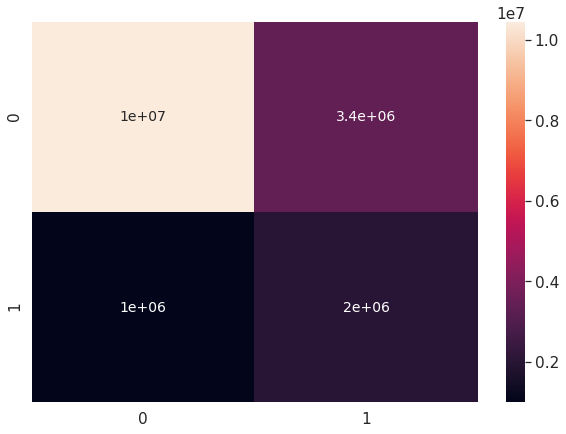

In [0]:
model_version = 'rf_model_final'
feat_imp = pd.read_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/model_meta/{model_version}/feat_imp.csv')
trainScoreAndLabels_pd = pd.read_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/model_meta/{model_version}/train_pred.csv')
testScoreAndLabels_pd = pd.read_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/model_meta/{model_version}/test_pred.csv')

y_train_true = trainScoreAndLabels_pd["label"]
y_train_pred = trainScoreAndLabels_pd["raw"]
conf_mat_train = confusion_matrix(y_train_true, y_train_pred)

print("Train Set:")
print("Accuracy Score: ", accuracy_score(y_train_true, y_train_pred))
print("F1 Score: ", f1_score(y_train_true, y_train_pred))
print(classification_report(y_train_true, y_train_pred))


df_cm_train = pd.DataFrame(conf_mat_train, range(2), range(2))
plt.figure(figsize=(10,7))
sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm_train, annot=True, annot_kws={"size": 14}) # font size


# |TN FN|
# |FP TP|
plt.show()

Test Set:
Accuracy Score: 0.7353786420585948
F1 Score: 0.44425091486055907
 precision recall f1-score support

 0.0 0.89 0.77 0.83 5916611
 1.0 0.36 0.57 0.44 1354174

 accuracy 0.74 7270785
 macro avg 0.63 0.67 0.64 7270785
weighted avg 0.79 0.74 0.76 7270785

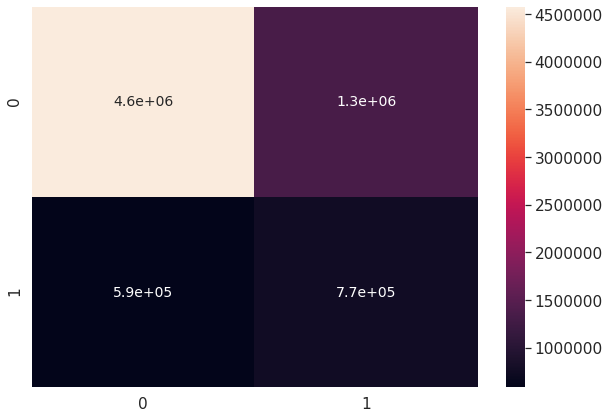

In [0]:
y_test_true = testScoreAndLabels_pd["label"]
y_test_pred = testScoreAndLabels_pd["raw"]
conf_mat_test = confusion_matrix(y_test_true, y_test_pred)

print("Test Set:")
print("Accuracy Score: ", accuracy_score(y_test_true, y_test_pred))
print("F1 Score: ", f1_score(y_test_true, y_test_pred))
print(classification_report(y_test_true, y_test_pred))


df_cm_test = pd.DataFrame(conf_mat_test, range(2), range(2))
plt.figure(figsize=(10,7))
sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm_test, annot=True, annot_kws={"size": 14}) # font size


# |TN FN|
# |FP TP|
plt.show()

In [0]:
model_version = 'rf_model_final'
feat_imp = pd.read_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/model_meta/{model_version}/feat_imp.csv')
feat_imp.head(30)

Out[25]:

,idx,name,score,order
0,0,DELAYS_SO_FAR,0.384851,1
1,2,MINUTES_AFTER_MIDNIGHT_DEST,0.064945,2
2,1,MINUTES_AFTER_MIDNIGHT_ORIGIN,0.063239,3
3,19,DEP_HOUR_BIN_catVec_1,0.054751,4
4,3,NETWORK_CONGESTION,0.047824,5
5,4,AVG_VIS_DIS_ORIGIN,0.042536,6
6,7,AVG_DEW_DEG_ORIGIN,0.037950,7
7,5,DEST_PR,0.037800,8
8,6,ORIGIN_PR,0.036377,9
9,8,CRS_ELAPSED_TIME,0.031599,10


### To Be Continued...

Some of the next things we hope to try to improve the model is to revisit the outcomes and continue our analysis on the trends we see in incorrect prediction. Looking at things on a per class basis, there are areas for improvement. 

Conducting an exhaustive hyper parameter tuning phase, as well as trying new model variants such as **XGBoost** and **Gradient Boosted Trees** are on the roadmap. 

Overall, this project has been a huge learning opportunity for our team. From messy raw data, to cleaning, to clustering, to feature engineering, to modelling, and to all of these phases all over again, this project has taken us through a complete data science lifecycle.

<em>Until next time, safe travels, and thank you for flying with us! <em>